In [363]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker #For changing ticker location and formatting
import seaborn as sns

from sklearn.linear_model import LinearRegression, Ridge, RidgeCV, Lasso, LassoCV
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn import metrics
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.preprocessing import StandardScaler, PolynomialFeatures

In [364]:
df = pd.read_csv('../datasets/clean_recoded_ames.csv')
df.head()

,id,pid,ms_subclass,ms_zoning,lot_frontage,lot_area,street,alley,lot_shape,land_contour,utilities,lot_config,land_slope,neighborhood,condition_1,condition_2,bldg_type,house_style,overall_qual,overall_cond,year_built,year_remod/add,roof_style,roof_matl,exterior_1st,exterior_2nd,mas_vnr_type,mas_vnr_area,exter_qual,exter_cond,foundation,bsmt_qual,bsmt_cond,bsmt_exposure,bsmtfin_type_1,bsmtfin_sf_1,bsmtfin_type_2,bsmtfin_sf_2,bsmt_unf_sf,total_bsmt_sf,heating,heating_qc,central_air,electrical,1st_flr_sf,2nd_flr_sf,low_qual_fin_sf,gr_liv_area,bsmt_full_bath,bsmt_half_bath,full_bath,half_bath,bedroom_abvgr,kitchen_abvgr,kitchen_qual,totrms_abvgrd,functional,fireplaces,fireplace_qu,garage_type,garage_yr_blt,garage_finish,garage_cars,garage_area,garage_qual,garage_cond,paved_drive,wood_deck_sf,open_porch_sf,enclosed_porch,3ssn_porch,screen_porch,pool_area,pool_qc,fence,misc_feature,misc_val,mo_sold,yr_sold,sale_type,saleprice,age_at_sale,age_since_remod,bsmnt_fin_sf,sold_in_crisis,has_wood_deck,has_pool
0,109,533352170,60,RL,0.0,13517,Pave,NaN,3,Lvl,AllPub,CulDSac,3,Sawyer,RRAe,Norm,1Fam,2Story,6,8,1976,2005,Gable,CompShg,HdBoard,Plywood,BrkFace,289.0,4,3,CBlock,3,3,1,6,533.0,1,0.0,192.0,725.0,GasA,5,1,5,725,754,0,1479,0.0,0.0,2,1,3,1,4,6,8,0,0,Attchd,"1,976.0",2,2.0,475.0,3,3,3,0,44,0,0,0,0,NaN,0,NaN,0,3,2010,WD,130500,34,5,533.0,1,0,0
1,544,531379050,60,RL,43.0,11492,Pave,NaN,3,Lvl,AllPub,CulDSac,3,SawyerW,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,VinylSd,VinylSd,BrkFace,132.0,4,3,PConc,4,3,1,6,637.0,1,0.0,276.0,913.0,GasA,5,1,5,913,1209,0,2122,1.0,0.0,2,1,4,1,4,8,8,1,3,Attchd,"1,997.0",2,2.0,559.0,3,3,3,0,74,0,0,0,0,NaN,0,NaN,0,4,2009,WD,220000,13,12,637.0,1,0,0
2,153,535304180,20,RL,68.0,7922,Pave,NaN,4,Lvl,AllPub,Inside,3,NAmes,Norm,Norm,1Fam,1Story,5,7,1953,2007,Gable,CompShg,VinylSd,VinylSd,Unknown,0.0,3,4,CBlock,3,3,1,6,731.0,1,0.0,326.0,"1,057.0",GasA,3,1,5,1057,0,0,1057,1.0,0.0,1,0,3,1,4,5,8,0,0,Detchd,"1,953.0",1,1.0,246.0,3,3,3,0,52,0,0,0,0,NaN,0,NaN,0,1,2010,WD,109000,57,3,731.0,1,0,0
3,318,916386060,60,RL,73.0,9802,Pave,NaN,4,Lvl,AllPub,Inside,3,Timber,Norm,Norm,1Fam,2Story,5,5,2006,2007,Gable,CompShg,VinylSd,VinylSd,Unknown,0.0,3,3,PConc,4,3,1,1,0.0,1,0.0,384.0,384.0,GasA,4,1,5,744,700,0,1444,0.0,0.0,2,1,3,1,3,7,8,0,0,BuiltIn,"2,007.0",3,2.0,400.0,3,3,3,100,0,0,0,0,0,NaN,0,NaN,0,4,2010,WD,174000,4,3,0.0,1,1,0
4,255,906425045,50,RL,82.0,14235,Pave,NaN,3,Lvl,AllPub,Inside,3,SawyerW,Norm,Norm,1Fam,1.5Fin,6,8,1900,1993,Gable,CompShg,Wd Sdng,Plywood,Unknown,0.0,3,3,PConc,2,4,1,1,0.0,1,0.0,676.0,676.0,GasA,3,1,5,831,614,0,1445,0.0,0.0,2,0,3,1,3,6,8,0,0,Detchd,"1,957.0",1,2.0,484.0,3,3,1,0,59,0,0,0,0,NaN,0,NaN,0,3,2010,WD,138500,110,17,0.0,1,0,0


In [365]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2049 entries, 0 to 2048
Data columns (total 87 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               2049 non-null   int64  
 1   pid              2049 non-null   int64  
 2   ms_subclass      2049 non-null   int64  
 3   ms_zoning        2049 non-null   object 
 4   lot_frontage     2049 non-null   float64
 5   lot_area         2049 non-null   int64  
 6   street           2049 non-null   object 
 7   alley            140 non-null    object 
 8   lot_shape        2049 non-null   int64  
 9   land_contour     2049 non-null   object 
 10  utilities        2049 non-null   object 
 11  lot_config       2049 non-null   object 
 12  land_slope       2049 non-null   int64  
 13  neighborhood     2049 non-null   object 
 14  condition_1      2049 non-null   object 
 15  condition_2      2049 non-null   object 
 16  bldg_type        2049 non-null   object 
 17  house_style   

##### Was exporting mo_sold as a string, but importing as an object so recalling it a string. Same with Garage Type - nulls should be filled in on last data set.

In [366]:
df['mo_sold'] = df['mo_sold'].astype(str)

In [367]:
df['garage_type'].fillna('None', inplace = True)

In [368]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2049 entries, 0 to 2048
Data columns (total 87 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               2049 non-null   int64  
 1   pid              2049 non-null   int64  
 2   ms_subclass      2049 non-null   int64  
 3   ms_zoning        2049 non-null   object 
 4   lot_frontage     2049 non-null   float64
 5   lot_area         2049 non-null   int64  
 6   street           2049 non-null   object 
 7   alley            140 non-null    object 
 8   lot_shape        2049 non-null   int64  
 9   land_contour     2049 non-null   object 
 10  utilities        2049 non-null   object 
 11  lot_config       2049 non-null   object 
 12  land_slope       2049 non-null   int64  
 13  neighborhood     2049 non-null   object 
 14  condition_1      2049 non-null   object 
 15  condition_2      2049 non-null   object 
 16  bldg_type        2049 non-null   object 
 17  house_style   

In [369]:
null_model = df['saleprice'].mean()
null_model

181479.01805758907

In [370]:
#Residuals for Null model - 
resdiuals = null_model - df['saleprice']
resdiuals

#SSE
(resdiuals ** 2).sum()

#MSE
( (resdiuals ** 2).sum() ) / len(resdiuals)

#RMSE
( ( (resdiuals ** 2).sum() ) / len(resdiuals) ) ** 0.5

#metrics.mean_squared_error(df['saleprice'], null_model, squared = False)

79276.56098763691

#### Identify which variables correlate with sale price to help with feature selection

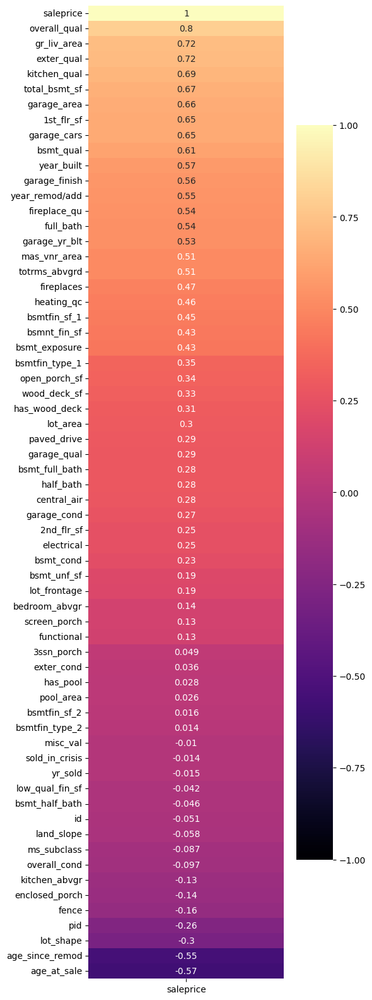

In [371]:
plt.figure(figsize = (5,20))

sns.heatmap(df.corr(numeric_only = True) 
            [['saleprice']].sort_values(by = 'saleprice', ascending = False),
            vmin = -1, vmax = 1,
            annot = True, cmap = 'magma');

In [372]:
#The correlation values for saleprice
correlation_values = df.corr(numeric_only = True)[['saleprice']]
correlation_values.sort_values('saleprice')

,saleprice
age_at_sale,-0.6
age_since_remod,-0.6
lot_shape,-0.3
pid,-0.3
fence,-0.2
enclosed_porch,-0.1
kitchen_abvgr,-0.1
overall_cond,-0.1
ms_subclass,-0.1
land_slope,-0.1


In [373]:
#Selecting just those where the correlation is above 0.3 or below 0.3
numeric_cols_corr_above_abs_3 = correlation_values[ (correlation_values['saleprice'] > 0.3 ) | (correlation_values['saleprice'] < -0.3 ) ]
print(type(numeric_cols_corr_above_abs_3))
numeric_cols_corr_above_abs_3.sort_values('saleprice')

<class 'pandas.core.frame.DataFrame'>


,saleprice
age_at_sale,-0.6
age_since_remod,-0.6
lot_area,0.3
has_wood_deck,0.3
wood_deck_sf,0.3
open_porch_sf,0.3
bsmtfin_type_1,0.4
bsmt_exposure,0.4
bsmnt_fin_sf,0.4
bsmtfin_sf_1,0.4


In [374]:
numeric_cols = numeric_cols_corr_above_abs_3.index.tolist()
print(type(numeric_cols))
numeric_cols

<class 'list'>


['lot_area',
 'overall_qual',
 'year_built',
 'year_remod/add',
 'mas_vnr_area',
 'exter_qual',
 'bsmt_qual',
 'bsmt_exposure',
 'bsmtfin_type_1',
 'bsmtfin_sf_1',
 'total_bsmt_sf',
 'heating_qc',
 '1st_flr_sf',
 'gr_liv_area',
 'full_bath',
 'kitchen_qual',
 'totrms_abvgrd',
 'fireplaces',
 'fireplace_qu',
 'garage_yr_blt',
 'garage_finish',
 'garage_cars',
 'garage_area',
 'wood_deck_sf',
 'open_porch_sf',
 'saleprice',
 'age_at_sale',
 'age_since_remod',
 'bsmnt_fin_sf',
 'has_wood_deck']

In [375]:
numeric_cols_to_remove = ['saleprice', 'garage_yr_blt', 'year_built', 'year_remod/add']
    # Removing Garage Yr Built since it has nulls, and year_built, year_remod/add since better coded as age
filtered_numeric_cols = [feature for feature in numeric_cols if feature not in numeric_cols_to_remove]
filtered_numeric_cols

['lot_area',
 'overall_qual',
 'mas_vnr_area',
 'exter_qual',
 'bsmt_qual',
 'bsmt_exposure',
 'bsmtfin_type_1',
 'bsmtfin_sf_1',
 'total_bsmt_sf',
 'heating_qc',
 '1st_flr_sf',
 'gr_liv_area',
 'full_bath',
 'kitchen_qual',
 'totrms_abvgrd',
 'fireplaces',
 'fireplace_qu',
 'garage_finish',
 'garage_cars',
 'garage_area',
 'wood_deck_sf',
 'open_porch_sf',
 'age_at_sale',
 'age_since_remod',
 'bsmnt_fin_sf',
 'has_wood_deck']

#### Model based on all numeric values

In [376]:
numeric_data = df.select_dtypes(exclude = 'object')
numeric_data.head(5)

,id,pid,ms_subclass,lot_frontage,lot_area,lot_shape,land_slope,overall_qual,overall_cond,year_built,year_remod/add,mas_vnr_area,exter_qual,exter_cond,bsmt_qual,bsmt_cond,bsmt_exposure,bsmtfin_type_1,bsmtfin_sf_1,bsmtfin_type_2,bsmtfin_sf_2,bsmt_unf_sf,total_bsmt_sf,heating_qc,central_air,electrical,1st_flr_sf,2nd_flr_sf,low_qual_fin_sf,gr_liv_area,bsmt_full_bath,bsmt_half_bath,full_bath,half_bath,bedroom_abvgr,kitchen_abvgr,kitchen_qual,totrms_abvgrd,functional,fireplaces,fireplace_qu,garage_yr_blt,garage_finish,garage_cars,garage_area,garage_qual,garage_cond,paved_drive,wood_deck_sf,open_porch_sf,enclosed_porch,3ssn_porch,screen_porch,pool_area,fence,misc_val,yr_sold,saleprice,age_at_sale,age_since_remod,bsmnt_fin_sf,sold_in_crisis,has_wood_deck,has_pool
0,109,533352170,60,0.0,13517,3,3,6,8,1976,2005,289.0,4,3,3,3,1,6,533.0,1,0.0,192.0,725.0,5,1,5,725,754,0,1479,0.0,0.0,2,1,3,1,4,6,8,0,0,"1,976.0",2,2.0,475.0,3,3,3,0,44,0,0,0,0,0,0,2010,130500,34,5,533.0,1,0,0
1,544,531379050,60,43.0,11492,3,3,7,5,1996,1997,132.0,4,3,4,3,1,6,637.0,1,0.0,276.0,913.0,5,1,5,913,1209,0,2122,1.0,0.0,2,1,4,1,4,8,8,1,3,"1,997.0",2,2.0,559.0,3,3,3,0,74,0,0,0,0,0,0,2009,220000,13,12,637.0,1,0,0
2,153,535304180,20,68.0,7922,4,3,5,7,1953,2007,0.0,3,4,3,3,1,6,731.0,1,0.0,326.0,"1,057.0",3,1,5,1057,0,0,1057,1.0,0.0,1,0,3,1,4,5,8,0,0,"1,953.0",1,1.0,246.0,3,3,3,0,52,0,0,0,0,0,0,2010,109000,57,3,731.0,1,0,0
3,318,916386060,60,73.0,9802,4,3,5,5,2006,2007,0.0,3,3,4,3,1,1,0.0,1,0.0,384.0,384.0,4,1,5,744,700,0,1444,0.0,0.0,2,1,3,1,3,7,8,0,0,"2,007.0",3,2.0,400.0,3,3,3,100,0,0,0,0,0,0,0,2010,174000,4,3,0.0,1,1,0
4,255,906425045,50,82.0,14235,3,3,6,8,1900,1993,0.0,3,3,2,4,1,1,0.0,1,0.0,676.0,676.0,3,1,5,831,614,0,1445,0.0,0.0,2,0,3,1,3,6,8,0,0,"1,957.0",1,2.0,484.0,3,3,1,0,59,0,0,0,0,0,0,2010,138500,110,17,0.0,1,0,0


In [377]:
numeric_data.dtypes

id                   int64
pid                  int64
ms_subclass          int64
lot_frontage       float64
lot_area             int64
lot_shape            int64
land_slope           int64
overall_qual         int64
overall_cond         int64
year_built           int64
year_remod/add       int64
mas_vnr_area       float64
exter_qual           int64
exter_cond           int64
bsmt_qual            int64
bsmt_cond            int64
bsmt_exposure        int64
bsmtfin_type_1       int64
bsmtfin_sf_1       float64
bsmtfin_type_2       int64
bsmtfin_sf_2       float64
bsmt_unf_sf        float64
total_bsmt_sf      float64
heating_qc           int64
central_air          int64
electrical           int64
1st_flr_sf           int64
2nd_flr_sf           int64
low_qual_fin_sf      int64
gr_liv_area          int64
bsmt_full_bath     float64
bsmt_half_bath     float64
full_bath            int64
half_bath            int64
bedroom_abvgr        int64
kitchen_abvgr        int64
kitchen_qual         int64
t

In [378]:
numeric_data_cols = numeric_data.columns.tolist()
numeric_data_cols

['id',
 'pid',
 'ms_subclass',
 'lot_frontage',
 'lot_area',
 'lot_shape',
 'land_slope',
 'overall_qual',
 'overall_cond',
 'year_built',
 'year_remod/add',
 'mas_vnr_area',
 'exter_qual',
 'exter_cond',
 'bsmt_qual',
 'bsmt_cond',
 'bsmt_exposure',
 'bsmtfin_type_1',
 'bsmtfin_sf_1',
 'bsmtfin_type_2',
 'bsmtfin_sf_2',
 'bsmt_unf_sf',
 'total_bsmt_sf',
 'heating_qc',
 'central_air',
 'electrical',
 '1st_flr_sf',
 '2nd_flr_sf',
 'low_qual_fin_sf',
 'gr_liv_area',
 'bsmt_full_bath',
 'bsmt_half_bath',
 'full_bath',
 'half_bath',
 'bedroom_abvgr',
 'kitchen_abvgr',
 'kitchen_qual',
 'totrms_abvgrd',
 'functional',
 'fireplaces',
 'fireplace_qu',
 'garage_yr_blt',
 'garage_finish',
 'garage_cars',
 'garage_area',
 'garage_qual',
 'garage_cond',
 'paved_drive',
 'wood_deck_sf',
 'open_porch_sf',
 'enclosed_porch',
 '3ssn_porch',
 'screen_porch',
 'pool_area',
 'fence',
 'misc_val',
 'yr_sold',
 'saleprice',
 'age_at_sale',
 'age_since_remod',
 'bsmnt_fin_sf',
 'sold_in_crisis',
 'has_wood

In [379]:
numeric_data.isnull().sum()

id                   0
pid                  0
ms_subclass          0
lot_frontage         0
lot_area             0
lot_shape            0
land_slope           0
overall_qual         0
overall_cond         0
year_built           0
year_remod/add       0
mas_vnr_area         0
exter_qual           0
exter_cond           0
bsmt_qual            0
bsmt_cond            0
bsmt_exposure        0
bsmtfin_type_1       0
bsmtfin_sf_1         0
bsmtfin_type_2       0
bsmtfin_sf_2         0
bsmt_unf_sf          0
total_bsmt_sf        0
heating_qc           0
central_air          0
electrical           0
1st_flr_sf           0
2nd_flr_sf           0
low_qual_fin_sf      0
gr_liv_area          0
bsmt_full_bath       0
bsmt_half_bath       0
full_bath            0
half_bath            0
bedroom_abvgr        0
kitchen_abvgr        0
kitchen_qual         0
totrms_abvgrd        0
functional           0
fireplaces           0
fireplace_qu         0
garage_yr_blt      114
garage_finish        0
garage_cars

In [380]:
cols_to_drop = ['id', 'pid', 'saleprice', 'garage_yr_blt'] #Drop unique IDs, sale price, and garage_yr_blt since it has nulls
X_numeric = numeric_data.drop(cols_to_drop, axis = 1)
y_numeric = df['saleprice']

In [381]:
X_numeric.head()

,ms_subclass,lot_frontage,lot_area,lot_shape,land_slope,overall_qual,overall_cond,year_built,year_remod/add,mas_vnr_area,exter_qual,exter_cond,bsmt_qual,bsmt_cond,bsmt_exposure,bsmtfin_type_1,bsmtfin_sf_1,bsmtfin_type_2,bsmtfin_sf_2,bsmt_unf_sf,total_bsmt_sf,heating_qc,central_air,electrical,1st_flr_sf,2nd_flr_sf,low_qual_fin_sf,gr_liv_area,bsmt_full_bath,bsmt_half_bath,full_bath,half_bath,bedroom_abvgr,kitchen_abvgr,kitchen_qual,totrms_abvgrd,functional,fireplaces,fireplace_qu,garage_finish,garage_cars,garage_area,garage_qual,garage_cond,paved_drive,wood_deck_sf,open_porch_sf,enclosed_porch,3ssn_porch,screen_porch,pool_area,fence,misc_val,yr_sold,age_at_sale,age_since_remod,bsmnt_fin_sf,sold_in_crisis,has_wood_deck,has_pool
0,60,0.0,13517,3,3,6,8,1976,2005,289.0,4,3,3,3,1,6,533.0,1,0.0,192.0,725.0,5,1,5,725,754,0,1479,0.0,0.0,2,1,3,1,4,6,8,0,0,2,2.0,475.0,3,3,3,0,44,0,0,0,0,0,0,2010,34,5,533.0,1,0,0
1,60,43.0,11492,3,3,7,5,1996,1997,132.0,4,3,4,3,1,6,637.0,1,0.0,276.0,913.0,5,1,5,913,1209,0,2122,1.0,0.0,2,1,4,1,4,8,8,1,3,2,2.0,559.0,3,3,3,0,74,0,0,0,0,0,0,2009,13,12,637.0,1,0,0
2,20,68.0,7922,4,3,5,7,1953,2007,0.0,3,4,3,3,1,6,731.0,1,0.0,326.0,"1,057.0",3,1,5,1057,0,0,1057,1.0,0.0,1,0,3,1,4,5,8,0,0,1,1.0,246.0,3,3,3,0,52,0,0,0,0,0,0,2010,57,3,731.0,1,0,0
3,60,73.0,9802,4,3,5,5,2006,2007,0.0,3,3,4,3,1,1,0.0,1,0.0,384.0,384.0,4,1,5,744,700,0,1444,0.0,0.0,2,1,3,1,3,7,8,0,0,3,2.0,400.0,3,3,3,100,0,0,0,0,0,0,0,2010,4,3,0.0,1,1,0
4,50,82.0,14235,3,3,6,8,1900,1993,0.0,3,3,2,4,1,1,0.0,1,0.0,676.0,676.0,3,1,5,831,614,0,1445,0.0,0.0,2,0,3,1,3,6,8,0,0,1,2.0,484.0,3,3,1,0,59,0,0,0,0,0,0,2010,110,17,0.0,1,0,0


In [382]:
cols_in_final_model = X_numeric.columns.tolist()
print(type(cols_in_final_model))
cols_in_final_model

<class 'list'>


['ms_subclass',
 'lot_frontage',
 'lot_area',
 'lot_shape',
 'land_slope',
 'overall_qual',
 'overall_cond',
 'year_built',
 'year_remod/add',
 'mas_vnr_area',
 'exter_qual',
 'exter_cond',
 'bsmt_qual',
 'bsmt_cond',
 'bsmt_exposure',
 'bsmtfin_type_1',
 'bsmtfin_sf_1',
 'bsmtfin_type_2',
 'bsmtfin_sf_2',
 'bsmt_unf_sf',
 'total_bsmt_sf',
 'heating_qc',
 'central_air',
 'electrical',
 '1st_flr_sf',
 '2nd_flr_sf',
 'low_qual_fin_sf',
 'gr_liv_area',
 'bsmt_full_bath',
 'bsmt_half_bath',
 'full_bath',
 'half_bath',
 'bedroom_abvgr',
 'kitchen_abvgr',
 'kitchen_qual',
 'totrms_abvgrd',
 'functional',
 'fireplaces',
 'fireplace_qu',
 'garage_finish',
 'garage_cars',
 'garage_area',
 'garage_qual',
 'garage_cond',
 'paved_drive',
 'wood_deck_sf',
 'open_porch_sf',
 'enclosed_porch',
 '3ssn_porch',
 'screen_porch',
 'pool_area',
 'fence',
 'misc_val',
 'yr_sold',
 'age_at_sale',
 'age_since_remod',
 'bsmnt_fin_sf',
 'sold_in_crisis',
 'has_wood_deck',
 'has_pool']

In [383]:
X_numeric.shape, y_numeric.shape

((2049, 60), (2049,))

In [384]:
X_numeric_train, X_numeric_test, y_numeric_train, y_numeric_test = train_test_split(X_numeric, y_numeric)

In [385]:
X_numeric_train.shape, X_numeric_test.shape, y_numeric_train.shape, y_numeric_test.shape

((1536, 60), (513, 60), (1536,), (513,))

In [386]:
lr_numeric = LinearRegression()

In [387]:
#Fitt on Train Data
lr_numeric.fit(X_numeric_train, y_numeric_train)

LinearRegression()

In [388]:
#Score train data
lr_numeric.score(X_numeric_train, y_numeric_train)

0.8966398521976858

In [389]:
#Score test data
lr_numeric.score(X_numeric_test, y_numeric_test)

0.8941104411725928

In [390]:
cross_val_score(lr_numeric, X_numeric_train, y_numeric_train).mean()

0.8816976948056645

In [391]:
y_numeric_preds = lr_numeric.predict(X_numeric_test)
    #This is what I'll assign to the Kaggle test score

rmse = metrics.mean_squared_error(y_numeric_test, y_numeric_preds, squared = False)
rmse

25255.100801325505

In [392]:
lr_numeric.coef_

array([-1.19910738e+02,  9.35599344e+01,  3.84065320e-01, -1.66212089e+03,
       -4.25971055e+03,  8.98515967e+03,  5.73752444e+03,  1.84851311e+02,
        4.21667302e+01,  3.12612079e+01,  1.33778428e+04, -1.31582345e+03,
        5.65845396e+03, -9.55891739e+03,  5.53438885e+03, -1.41416414e+03,
        1.36221951e+01, -3.50366905e+02, -8.67193255e-02,  2.68416075e+00,
        1.62196366e+01,  1.76236603e+03, -4.51257847e+03, -2.96263911e+03,
        2.16963737e+01,  2.32793874e+01, -1.49317458e+01,  3.00440153e+01,
        2.08416641e+03, -3.80384901e+03,  4.73910176e+02,  5.44513588e+01,
       -6.72472924e+03, -1.31871824e+04,  1.06229383e+04,  3.97382829e+03,
        5.80403839e+03,  1.94308869e+03,  1.38835784e+03, -1.19676746e+03,
        6.64150127e+02,  2.67640117e+01, -3.67516949e+02, -3.22965891e+03,
        8.86625576e+02,  2.67276205e+01, -1.49395533e+00,  1.91597247e+01,
       -1.72981805e+01,  4.57130227e+01, -2.98747075e+01, -4.76302913e+02,
        6.66528877e-01,  

##### In this model, having a pool increases the value of a house by $33,077 over not having a pool, all other variables being held equal.

##### One unit changes in exterior quality have more impact on the price of a house than changes in kitchen quality or basement quality. All things being held equal, a one unit change in exterior quality increases the sale price by $13,832. 

##### However, a one unit change in kitchen quality increases the value by just $9,061. Increasing basement quality increases the sale price by $5,658 (all other things being held equal).

In [393]:
pd.DataFrame(data = lr_numeric.coef_,
             index = X_numeric.columns,
             columns = ['Coefficients']).sort_values(by = 'Coefficients', ascending = False)

,Coefficients
has_pool,"29,843.3"
exter_qual,"13,377.8"
kitchen_qual,"10,622.9"
overall_qual,"8,985.2"
functional,"5,804.0"
overall_cond,"5,737.5"
bsmt_qual,"5,658.5"
bsmt_exposure,"5,534.4"
totrms_abvgrd,"3,973.8"
bsmt_full_bath,"2,084.2"


In [394]:
model_coefs = pd.DataFrame(data = lr_numeric.coef_,
             index = X_numeric.columns,
             columns = ['Coefficients']).sort_values(by = 'Coefficients', ascending = False)

In [395]:
type(model_coefs)

pandas.core.frame.DataFrame

In [396]:
model_coefs.to_csv('../datasets/model_coefs.csv')

## All things being equal, selling your house during the Great Recession (2008 - 2010) reduced the Ames home value by $2,069.30

## Model based on just numeric values where correlation is above abs(0.3)

In [397]:
X = df[filtered_numeric_cols]
y = df['saleprice']

In [398]:
X_train, X_test, y_train, y_test = train_test_split(X, y)

In [399]:
lr = LinearRegression()

#Fit on Train Data
lr.fit(X_train, y_train)

LinearRegression()

In [400]:
#Score train data
lr.score(X_train, y_train)

0.8809880859332251

In [401]:
#Score test data
lr.score(X_test, y_test)

0.8756720169006788

In [402]:
cross_val_score(lr, X_train, y_train).mean()

0.873416735479684

In [403]:
#Run RMSE

y_preds = lr.predict(X_test)

initial_rmse = metrics.mean_squared_error(y_test, y_preds, squared = False) #Use Squared = False to make it root mean squared error
initial_rmse

28068.842851155496

In [404]:
lr.intercept_

-122167.15730847223

In [405]:
pd.DataFrame(data = lr.coef_, index = X.columns, columns = ['Coefficients']).sort_values('Coefficients', ascending = False)

,Coefficients
exter_qual,"18,930.5"
overall_qual,"11,436.4"
kitchen_qual,"9,555.5"
fireplace_qu,"3,360.9"
bsmt_exposure,"3,195.3"
heating_qc,"2,230.0"
totrms_abvgrd,"1,718.9"
bsmt_qual,"1,614.7"
gr_liv_area,43.5
garage_area,39.5


#### In this model, exterior quality is the strongest predictor of change in price, with a one unit change in exterior quality leading to a $15,017 increase in sale price, all things being held equal.

### Using Standard Scaler

In [406]:
sc = StandardScaler()

X_scaled = sc.fit_transform(X)

In [407]:
X_scaled.shape

(2049, 26)

In [408]:
X_scaled_train, X_scaled_test, y_train, y_test = train_test_split(X_scaled, y)

In [409]:
lr_scaled = LinearRegression()

#Fit on Train Data
lr_scaled.fit(X_scaled_train, y_train)

LinearRegression()

In [410]:
#Score Train Data
lr_scaled.score(X_scaled_train, y_train)

0.879418671470968

In [411]:
#Score Test Data
lr_scaled.score(X_scaled_test, y_test)

0.8802299995985662

In [412]:
cross_val_score(lr_scaled, X_scaled_train, y_train).mean()

0.870541025018887

In [413]:
y_scaled_preds = lr_scaled.predict(X_scaled_test)

scaled_rmse = metrics.mean_squared_error(y_test, y_scaled_preds, squared = False) #Use Squared = False to make it root mean squared error
scaled_rmse

26827.90015997265

In [414]:
pd.DataFrame(data = lr_scaled.coef_, index = X.columns, columns = ['Coefficients']).sort_values('Coefficients', ascending = False)

,Coefficients
gr_liv_area,"23,725.0"
overall_qual,"16,660.6"
exter_qual,"9,921.5"
bsmtfin_sf_1,"7,561.6"
kitchen_qual,"7,321.6"
garage_area,"6,181.9"
total_bsmt_sf,"5,535.3"
mas_vnr_area,"5,392.5"
fireplace_qu,"5,150.4"
bsmnt_fin_sf,"4,985.4"


### Selecting just the columns that are strings / objects

In [415]:
df.select_dtypes(include = 'object').head(5)

,ms_zoning,street,alley,land_contour,utilities,lot_config,neighborhood,condition_1,condition_2,bldg_type,house_style,roof_style,roof_matl,exterior_1st,exterior_2nd,mas_vnr_type,foundation,heating,garage_type,pool_qc,misc_feature,mo_sold,sale_type
0,RL,Pave,NaN,Lvl,AllPub,CulDSac,Sawyer,RRAe,Norm,1Fam,2Story,Gable,CompShg,HdBoard,Plywood,BrkFace,CBlock,GasA,Attchd,NaN,NaN,3,WD
1,RL,Pave,NaN,Lvl,AllPub,CulDSac,SawyerW,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,PConc,GasA,Attchd,NaN,NaN,4,WD
2,RL,Pave,NaN,Lvl,AllPub,Inside,NAmes,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,Unknown,CBlock,GasA,Detchd,NaN,NaN,1,WD
3,RL,Pave,NaN,Lvl,AllPub,Inside,Timber,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,Unknown,PConc,GasA,BuiltIn,NaN,NaN,4,WD
4,RL,Pave,NaN,Lvl,AllPub,Inside,SawyerW,Norm,Norm,1Fam,1.5Fin,Gable,CompShg,Wd Sdng,Plywood,Unknown,PConc,GasA,Detchd,NaN,NaN,3,WD


In [416]:
df.select_dtypes(include = 'object').columns

Index(['ms_zoning', 'street', 'alley', 'land_contour', 'utilities',
       'lot_config', 'neighborhood', 'condition_1', 'condition_2', 'bldg_type',
       'house_style', 'roof_style', 'roof_matl', 'exterior_1st',
       'exterior_2nd', 'mas_vnr_type', 'foundation', 'heating', 'garage_type',
       'pool_qc', 'misc_feature', 'mo_sold', 'sale_type'],
      dtype='object')

In [417]:
#Making it a regular list rather than a numpy array / list - Argo helped with this since initially was converting above cell to a list, but it was a numpy array list so was causing an issue when I 
column_list = [feature for feature in df.columns if df[feature].dtype == 'object']
column_list

['ms_zoning',
 'street',
 'alley',
 'land_contour',
 'utilities',
 'lot_config',
 'neighborhood',
 'condition_1',
 'condition_2',
 'bldg_type',
 'house_style',
 'roof_style',
 'roof_matl',
 'exterior_1st',
 'exterior_2nd',
 'mas_vnr_type',
 'foundation',
 'heating',
 'garage_type',
 'pool_qc',
 'misc_feature',
 'mo_sold',
 'sale_type']

In [418]:
#Creating a list of features to remove based on EDA where more than 90% of houses share a single feature
features_to_remove = ['street', 'alley', 'land_contour', 'utilities', 'condition_2', 'roof_matl', 'heating', 'pool_qc', 'misc_feature']
print(type(features_to_remove))
features_to_remove

<class 'list'>


['street',
 'alley',
 'land_contour',
 'utilities',
 'condition_2',
 'roof_matl',
 'heating',
 'pool_qc',
 'misc_feature']

In [419]:
filtered_columns = [feature for feature in column_list if feature not in features_to_remove]
    #https://stackoverflow.com/questions/36268749/how-to-remove-multiple-items-from-a-list-in-just-one-statement

In [420]:
filtered_columns

['ms_zoning',
 'lot_config',
 'neighborhood',
 'condition_1',
 'bldg_type',
 'house_style',
 'roof_style',
 'exterior_1st',
 'exterior_2nd',
 'mas_vnr_type',
 'foundation',
 'garage_type',
 'mo_sold',
 'sale_type']

In [421]:
df[filtered_columns]

,ms_zoning,lot_config,neighborhood,condition_1,bldg_type,house_style,roof_style,exterior_1st,exterior_2nd,mas_vnr_type,foundation,garage_type,mo_sold,sale_type
0,RL,CulDSac,Sawyer,RRAe,1Fam,2Story,Gable,HdBoard,Plywood,BrkFace,CBlock,Attchd,3,WD
1,RL,CulDSac,SawyerW,Norm,1Fam,2Story,Gable,VinylSd,VinylSd,BrkFace,PConc,Attchd,4,WD
2,RL,Inside,NAmes,Norm,1Fam,1Story,Gable,VinylSd,VinylSd,Unknown,CBlock,Detchd,1,WD
3,RL,Inside,Timber,Norm,1Fam,2Story,Gable,VinylSd,VinylSd,Unknown,PConc,BuiltIn,4,WD
4,RL,Inside,SawyerW,Norm,1Fam,1.5Fin,Gable,Wd Sdng,Plywood,Unknown,PConc,Detchd,3,WD
5,RL,Corner,NAmes,PosA,1Fam,1Story,Gable,BrkFace,Plywood,Unknown,CBlock,Attchd,6,WD
6,RM,Inside,Edwards,Norm,TwnhsE,SFoyer,Gable,VinylSd,VinylSd,BrkFace,PConc,Basment,6,New
7,RL,Inside,NAmes,Norm,1Fam,1Story,Hip,Plywood,Plywood,BrkFace,CBlock,Attchd,5,COD
8,RL,Inside,OldTown,Artery,1Fam,1Story,Gable,Wd Sdng,Wd Sdng,Unknown,CBlock,Detchd,6,WD
9,RL,Inside,NAmes,Norm,1Fam,2Story,Gable,Plywood,Plywood,BrkFace,PConc,Attchd,9,WD


In [422]:
df_dums = pd.get_dummies(df[filtered_columns], dtype = int, 
                         sparse = False, 
                         drop_first = True)
    # Had to drop_first to drop first column to avoid multi-collinearity
    # If do one hot encoder, include Sparse  = False for linear regression (memory is just for one values)
df_dums.head(5)

,ms_zoning_C (all),ms_zoning_FV,ms_zoning_I (all),ms_zoning_RH,ms_zoning_RL,ms_zoning_RM,lot_config_CulDSac,lot_config_FR2,lot_config_FR3,lot_config_Inside,neighborhood_Blueste,neighborhood_BrDale,neighborhood_BrkSide,neighborhood_ClearCr,neighborhood_CollgCr,neighborhood_Crawfor,neighborhood_Edwards,neighborhood_Gilbert,neighborhood_Greens,neighborhood_GrnHill,neighborhood_IDOTRR,neighborhood_Landmrk,neighborhood_MeadowV,neighborhood_Mitchel,neighborhood_NAmes,neighborhood_NPkVill,neighborhood_NWAmes,neighborhood_NoRidge,neighborhood_NridgHt,neighborhood_OldTown,neighborhood_SWISU,neighborhood_Sawyer,neighborhood_SawyerW,neighborhood_Somerst,neighborhood_StoneBr,neighborhood_Timber,neighborhood_Veenker,condition_1_Feedr,condition_1_Norm,condition_1_PosA,condition_1_PosN,condition_1_RRAe,condition_1_RRAn,condition_1_RRNe,condition_1_RRNn,bldg_type_2fmCon,bldg_type_Duplex,bldg_type_Twnhs,bldg_type_TwnhsE,house_style_1.5Unf,house_style_1Story,house_style_2.5Fin,house_style_2.5Unf,house_style_2Story,house_style_SFoyer,house_style_SLvl,roof_style_Gable,roof_style_Gambrel,roof_style_Hip,roof_style_Mansard,roof_style_Shed,exterior_1st_AsphShn,exterior_1st_BrkComm,exterior_1st_BrkFace,exterior_1st_CBlock,exterior_1st_CemntBd,exterior_1st_HdBoard,exterior_1st_ImStucc,exterior_1st_MetalSd,exterior_1st_Plywood,exterior_1st_Stone,exterior_1st_Stucco,exterior_1st_VinylSd,exterior_1st_Wd Sdng,exterior_1st_WdShing,exterior_2nd_AsphShn,exterior_2nd_Brk Cmn,exterior_2nd_BrkFace,exterior_2nd_CBlock,exterior_2nd_CmentBd,exterior_2nd_HdBoard,exterior_2nd_ImStucc,exterior_2nd_MetalSd,exterior_2nd_Plywood,exterior_2nd_Stone,exterior_2nd_Stucco,exterior_2nd_VinylSd,exterior_2nd_Wd Sdng,exterior_2nd_Wd Shng,mas_vnr_type_BrkFace,mas_vnr_type_Stone,mas_vnr_type_Unknown,foundation_CBlock,foundation_PConc,foundation_Slab,foundation_Stone,foundation_Wood,garage_type_Attchd,garage_type_Basment,garage_type_BuiltIn,garage_type_CarPort,garage_type_Detchd,garage_type_None,mo_sold_10,mo_sold_11,mo_sold_12,mo_sold_2,mo_sold_3,mo_sold_4,mo_sold_5,mo_sold_6,mo_sold_7,mo_sold_8,mo_sold_9,sale_type_CWD,sale_type_Con,sale_type_ConLD,sale_type_ConLI,sale_type_ConLw,sale_type_New,sale_type_Oth,sale_type_WD
0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1
1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1
2,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
3,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1
4,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1


In [423]:
X_dum = df_dums
y = df['saleprice']

In [424]:
X_dum_train, X_dum_test, y_dum_train, y_dum_test = train_test_split(X_dum, y)

In [425]:
X_dum_train.shape, X_dum_test.shape, y_dum_train.shape, y_dum_test.shape

((1536, 122), (513, 122), (1536,), (513,))

In [426]:
lr_dum = LinearRegression()

In [427]:
# Fit on Train Data
lr_dum.fit(X_dum_train, y_dum_train)

LinearRegression()

In [428]:
# Score on Train Data
lr_dum.score(X_dum_train, y_dum_train)

0.744504258292165

#### Really bad score on test data set using categorical data only. Using categorical data only, the model overfits.

In [429]:
#Score on Tests Data
lr_dum.score(X_dum_test, y_dum_test)

0.6989707227524734

In [430]:
cross_val_score(lr_dum, X_dum_train, y_train).mean()

-1.8616478673001368e+22

In [431]:
y_dum_preds = lr_dum.predict(X_dum_test)

dum_rmse = metrics.mean_squared_error(y_dum_test, y_dum_preds, squared = False) #Use Squared = False to make it root mean squared error
dum_rmse

43082.64779512133

#### Really high RMSE error

In [432]:
pd.set_option('display.max_rows', None)

def format_with_commas(x):
    return '{:,.1f}'.format(x)

pd.options.display.float_format = format_with_commas

pd.DataFrame(data = lr_dum.coef_, index = df_dums.columns, columns = ['Coefficients']).sort_values('Coefficients', ascending = False)

,Coefficients
neighborhood_GrnHill,"110,562.2"
neighborhood_StoneBr,"93,836.9"
exterior_1st_CemntBd,"92,881.5"
neighborhood_NridgHt,"79,855.7"
neighborhood_NoRidge,"66,921.4"
house_style_2.5Fin,"60,744.0"
neighborhood_Greens,"60,583.4"
exterior_1st_Stone,"59,616.4"
house_style_2.5Unf,"59,351.8"
condition_1_PosA,"55,533.8"


#### Will try building up on categorical variables with fewer variables

In [433]:
df.select_dtypes(include = ['object']).columns

Index(['ms_zoning', 'street', 'alley', 'land_contour', 'utilities',
       'lot_config', 'neighborhood', 'condition_1', 'condition_2', 'bldg_type',
       'house_style', 'roof_style', 'roof_matl', 'exterior_1st',
       'exterior_2nd', 'mas_vnr_type', 'foundation', 'heating', 'garage_type',
       'pool_qc', 'misc_feature', 'mo_sold', 'sale_type'],
      dtype='object')

In [434]:
#These have more variance in breakdown within category
fewer_cats = df[['ms_zoning', 'neighborhood', 'bldg_type', 'house_style', 'foundation', 'garage_type', 'mo_sold']]

In [435]:
fewer_cats

,ms_zoning,neighborhood,bldg_type,house_style,foundation,garage_type,mo_sold
0,RL,Sawyer,1Fam,2Story,CBlock,Attchd,3
1,RL,SawyerW,1Fam,2Story,PConc,Attchd,4
2,RL,NAmes,1Fam,1Story,CBlock,Detchd,1
3,RL,Timber,1Fam,2Story,PConc,BuiltIn,4
4,RL,SawyerW,1Fam,1.5Fin,PConc,Detchd,3
5,RL,NAmes,1Fam,1Story,CBlock,Attchd,6
6,RM,Edwards,TwnhsE,SFoyer,PConc,Basment,6
7,RL,NAmes,1Fam,1Story,CBlock,Attchd,5
8,RL,OldTown,1Fam,1Story,CBlock,Detchd,6
9,RL,NAmes,1Fam,2Story,PConc,Attchd,9


In [436]:
fewer_cats.isnull().sum()

ms_zoning       0
neighborhood    0
bldg_type       0
house_style     0
foundation      0
garage_type     0
mo_sold         0
dtype: int64

In [437]:
df_fewer_dums = pd.get_dummies(df[['ms_zoning', 'neighborhood', 'bldg_type', 'house_style', 'foundation', 'garage_type', 'mo_sold']], dtype = int, 
                         sparse = False, 
                         drop_first = True)

In [438]:
df_fewer_dums.shape

(2049, 66)

In [439]:
df_fewer_dums

,ms_zoning_C (all),ms_zoning_FV,ms_zoning_I (all),ms_zoning_RH,ms_zoning_RL,ms_zoning_RM,neighborhood_Blueste,neighborhood_BrDale,neighborhood_BrkSide,neighborhood_ClearCr,neighborhood_CollgCr,neighborhood_Crawfor,neighborhood_Edwards,neighborhood_Gilbert,neighborhood_Greens,neighborhood_GrnHill,neighborhood_IDOTRR,neighborhood_Landmrk,neighborhood_MeadowV,neighborhood_Mitchel,neighborhood_NAmes,neighborhood_NPkVill,neighborhood_NWAmes,neighborhood_NoRidge,neighborhood_NridgHt,neighborhood_OldTown,neighborhood_SWISU,neighborhood_Sawyer,neighborhood_SawyerW,neighborhood_Somerst,neighborhood_StoneBr,neighborhood_Timber,neighborhood_Veenker,bldg_type_2fmCon,bldg_type_Duplex,bldg_type_Twnhs,bldg_type_TwnhsE,house_style_1.5Unf,house_style_1Story,house_style_2.5Fin,house_style_2.5Unf,house_style_2Story,house_style_SFoyer,house_style_SLvl,foundation_CBlock,foundation_PConc,foundation_Slab,foundation_Stone,foundation_Wood,garage_type_Attchd,garage_type_Basment,garage_type_BuiltIn,garage_type_CarPort,garage_type_Detchd,garage_type_None,mo_sold_10,mo_sold_11,mo_sold_12,mo_sold_2,mo_sold_3,mo_sold_4,mo_sold_5,mo_sold_6,mo_sold_7,mo_sold_8,mo_sold_9
0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
2,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0
5,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
6,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
7,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
8,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0
9,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1


In [440]:
df_fewer_dums.shape

(2049, 66)

In [441]:
X_few_dum = df_fewer_dums
y_few_dum = df['saleprice']

In [442]:
X_few_dum_train, X_few_dum_test, y_few_dum_train, y_few_dum_test = train_test_split(X_few_dum, y_few_dum)

In [443]:
X_few_dum_train.shape, X_few_dum_test.shape, y_few_dum_train.shape, y_few_dum_test.shape

((1536, 66), (513, 66), (1536,), (513,))

In [444]:
lr_fewer_dum = LinearRegression()

In [445]:
#Fit on Train Data
lr_fewer_dum.fit(X_few_dum_train, y_few_dum_train)

LinearRegression()

In [446]:
#Score on Train Data
lr_fewer_dum.score(X_few_dum_train, y_few_dum_train)

0.6759290265979261

In [447]:
# Score on Test Data
lr_fewer_dum.score(X_few_dum_test, y_few_dum_test)

0.6329948182992271

In [448]:
cross_val_score(lr_fewer_dum, X_few_dum_train, y_few_dum_train).mean()

-1.2491935859815833e+23

In [449]:
y_few_dum_preds = lr_fewer_dum.predict(X_few_dum_test)

In [450]:
few_dum_rmse = metrics.mean_squared_error(y_few_dum_test, y_few_dum_preds, squared = False)
few_dum_rmse

48346.82812003548

In [451]:
#### Now I'm getting a better cross validation score and a lower RMSE

In [452]:
lr_fewer_dum.intercept_

237524.60670981352

### In this model, the features that have the most impact in increasing the sale price are house_style, neighborhood and zoning.

A House style with 2.5 stories (2nd level finished) increases the sale price by $121,337 over a house style with 1 story, all other things being held equal.

Being in the neighborhood Stone Brook increases the sale price by $115,278 over being in Bloomington Heights, all other things being held equal.

Being zoned as Residential Medium Density increases the sale price by $95,550 over being zoned for agriculture, all other things being held equal.

In [453]:
pd.DataFrame(data = lr_fewer_dum.coef_, index = X_few_dum.columns, columns = ['Coefficients']).sort_values('Coefficients', ascending = False)

,Coefficients
house_style_2.5Fin,"136,539.4"
neighborhood_StoneBr,"95,250.5"
neighborhood_GrnHill,"78,040.5"
house_style_2.5Unf,"75,019.3"
neighborhood_NridgHt,"74,727.8"
neighborhood_NoRidge,"42,585.1"
neighborhood_Greens,"28,179.7"
foundation_PConc,"27,920.5"
neighborhood_Veenker,"26,973.8"
ms_zoning_RM,"21,087.9"


### Combined Model with Numeric Data and Categorical Data

In [454]:
print(type(filtered_numeric_cols))
print(type(df[filtered_numeric_cols]))
df[filtered_numeric_cols].shape

<class 'list'>
<class 'pandas.core.frame.DataFrame'>


(2049, 26)

In [455]:
print(type(fewer_cats))
fewer_cats.shape

<class 'pandas.core.frame.DataFrame'>


(2049, 7)

In [456]:
fewer_cats.columns

Index(['ms_zoning', 'neighborhood', 'bldg_type', 'house_style', 'foundation',
       'garage_type', 'mo_sold'],
      dtype='object')

In [457]:
fewer_cat_col_name = fewer_cats.columns.tolist()
fewer_cat_col_name

['ms_zoning',
 'neighborhood',
 'bldg_type',
 'house_style',
 'foundation',
 'garage_type',
 'mo_sold']

In [458]:
comb_df = df[filtered_numeric_cols + fewer_cat_col_name]
comb_df.head()

,lot_area,overall_qual,mas_vnr_area,exter_qual,bsmt_qual,bsmt_exposure,bsmtfin_type_1,bsmtfin_sf_1,total_bsmt_sf,heating_qc,1st_flr_sf,gr_liv_area,full_bath,kitchen_qual,totrms_abvgrd,fireplaces,fireplace_qu,garage_finish,garage_cars,garage_area,wood_deck_sf,open_porch_sf,age_at_sale,age_since_remod,bsmnt_fin_sf,has_wood_deck,ms_zoning,neighborhood,bldg_type,house_style,foundation,garage_type,mo_sold
0,13517,6,289.0,4,3,1,6,533.0,725.0,5,725,1479,2,4,6,0,0,2,2.0,475.0,0,44,34,5,533.0,0,RL,Sawyer,1Fam,2Story,CBlock,Attchd,3
1,11492,7,132.0,4,4,1,6,637.0,913.0,5,913,2122,2,4,8,1,3,2,2.0,559.0,0,74,13,12,637.0,0,RL,SawyerW,1Fam,2Story,PConc,Attchd,4
2,7922,5,0.0,3,3,1,6,731.0,"1,057.0",3,1057,1057,1,4,5,0,0,1,1.0,246.0,0,52,57,3,731.0,0,RL,NAmes,1Fam,1Story,CBlock,Detchd,1
3,9802,5,0.0,3,4,1,1,0.0,384.0,4,744,1444,2,3,7,0,0,3,2.0,400.0,100,0,4,3,0.0,1,RL,Timber,1Fam,2Story,PConc,BuiltIn,4
4,14235,6,0.0,3,2,1,1,0.0,676.0,3,831,1445,2,3,6,0,0,1,2.0,484.0,0,59,110,17,0.0,0,RL,SawyerW,1Fam,1.5Fin,PConc,Detchd,3


In [459]:
comb_df.shape

(2049, 33)

In [460]:
comb_df.isnull().sum()

lot_area           0
overall_qual       0
mas_vnr_area       0
exter_qual         0
bsmt_qual          0
bsmt_exposure      0
bsmtfin_type_1     0
bsmtfin_sf_1       0
total_bsmt_sf      0
heating_qc         0
1st_flr_sf         0
gr_liv_area        0
full_bath          0
kitchen_qual       0
totrms_abvgrd      0
fireplaces         0
fireplace_qu       0
garage_finish      0
garage_cars        0
garage_area        0
wood_deck_sf       0
open_porch_sf      0
age_at_sale        0
age_since_remod    0
bsmnt_fin_sf       0
has_wood_deck      0
ms_zoning          0
neighborhood       0
bldg_type          0
house_style        0
foundation         0
garage_type        0
mo_sold            0
dtype: int64

In [461]:
comb_dum = pd.get_dummies(comb_df, dtype = int, 
                         sparse = False, 
                         drop_first = True)

In [462]:
comb_dum.shape

(2049, 92)

In [463]:
comb_dum.columns

Index(['lot_area', 'overall_qual', 'mas_vnr_area', 'exter_qual', 'bsmt_qual',
       'bsmt_exposure', 'bsmtfin_type_1', 'bsmtfin_sf_1', 'total_bsmt_sf',
       'heating_qc', '1st_flr_sf', 'gr_liv_area', 'full_bath', 'kitchen_qual',
       'totrms_abvgrd', 'fireplaces', 'fireplace_qu', 'garage_finish',
       'garage_cars', 'garage_area', 'wood_deck_sf', 'open_porch_sf',
       'age_at_sale', 'age_since_remod', 'bsmnt_fin_sf', 'has_wood_deck',
       'ms_zoning_C (all)', 'ms_zoning_FV', 'ms_zoning_I (all)',
       'ms_zoning_RH', 'ms_zoning_RL', 'ms_zoning_RM', 'neighborhood_Blueste',
       'neighborhood_BrDale', 'neighborhood_BrkSide', 'neighborhood_ClearCr',
       'neighborhood_CollgCr', 'neighborhood_Crawfor', 'neighborhood_Edwards',
       'neighborhood_Gilbert', 'neighborhood_Greens', 'neighborhood_GrnHill',
       'neighborhood_IDOTRR', 'neighborhood_Landmrk', 'neighborhood_MeadowV',
       'neighborhood_Mitchel', 'neighborhood_NAmes', 'neighborhood_NPkVill',
       'neighborhoo

In [464]:
comb_dum.head(10)

,lot_area,overall_qual,mas_vnr_area,exter_qual,bsmt_qual,bsmt_exposure,bsmtfin_type_1,bsmtfin_sf_1,total_bsmt_sf,heating_qc,1st_flr_sf,gr_liv_area,full_bath,kitchen_qual,totrms_abvgrd,fireplaces,fireplace_qu,garage_finish,garage_cars,garage_area,wood_deck_sf,open_porch_sf,age_at_sale,age_since_remod,bsmnt_fin_sf,has_wood_deck,ms_zoning_C (all),ms_zoning_FV,ms_zoning_I (all),ms_zoning_RH,ms_zoning_RL,ms_zoning_RM,neighborhood_Blueste,neighborhood_BrDale,neighborhood_BrkSide,neighborhood_ClearCr,neighborhood_CollgCr,neighborhood_Crawfor,neighborhood_Edwards,neighborhood_Gilbert,neighborhood_Greens,neighborhood_GrnHill,neighborhood_IDOTRR,neighborhood_Landmrk,neighborhood_MeadowV,neighborhood_Mitchel,neighborhood_NAmes,neighborhood_NPkVill,neighborhood_NWAmes,neighborhood_NoRidge,neighborhood_NridgHt,neighborhood_OldTown,neighborhood_SWISU,neighborhood_Sawyer,neighborhood_SawyerW,neighborhood_Somerst,neighborhood_StoneBr,neighborhood_Timber,neighborhood_Veenker,bldg_type_2fmCon,bldg_type_Duplex,bldg_type_Twnhs,bldg_type_TwnhsE,house_style_1.5Unf,house_style_1Story,house_style_2.5Fin,house_style_2.5Unf,house_style_2Story,house_style_SFoyer,house_style_SLvl,foundation_CBlock,foundation_PConc,foundation_Slab,foundation_Stone,foundation_Wood,garage_type_Attchd,garage_type_Basment,garage_type_BuiltIn,garage_type_CarPort,garage_type_Detchd,garage_type_None,mo_sold_10,mo_sold_11,mo_sold_12,mo_sold_2,mo_sold_3,mo_sold_4,mo_sold_5,mo_sold_6,mo_sold_7,mo_sold_8,mo_sold_9
0,13517,6,289.0,4,3,1,6,533.0,725.0,5,725,1479,2,4,6,0,0,2,2.0,475.0,0,44,34,5,533.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1,11492,7,132.0,4,4,1,6,637.0,913.0,5,913,2122,2,4,8,1,3,2,2.0,559.0,0,74,13,12,637.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
2,7922,5,0.0,3,3,1,6,731.0,"1,057.0",3,1057,1057,1,4,5,0,0,1,1.0,246.0,0,52,57,3,731.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
3,9802,5,0.0,3,4,1,1,0.0,384.0,4,744,1444,2,3,7,0,0,3,2.0,400.0,100,0,4,3,0.0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0
4,14235,6,0.0,3,2,1,1,0.0,676.0,3,831,1445,2,3,6,0,0,1,2.0,484.0,0,59,110,17,0.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0
5,16492,6,0.0,4,3,1,5,247.0,"1,517.0",5,1888,1888,2,4,6,1,4,3,2.0,578.0,0,0,44,8,960.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
6,3675,6,82.0,3,4,4,6,547.0,547.0,4,1072,1072,2,3,5,0,0,3,2.0,525.0,0,44,1,0,547.0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
7,12160,5,180.0,3,3,1,3,"1,000.0","1,188.0",2,1188,1188,1,3,6,0,0,2,2.0,531.0,0,0,51,51,"1,000.0",0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
8,15783,5,0.0,3,3,1,3,292.0,924.0,3,924,924,1,3,6,0,0,1,1.0,420.0,0,324,55,55,292.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0
9,11606,5,192.0,3,4,3,3,650.0,"1,040.0",3,1040,2080,1,2,9,2,3,1,2.0,504.0,335,0,38,38,650.0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1


In [465]:
X_comb = comb_dum
y_comb = df['saleprice']

In [466]:
X_comb_train, X_comb_test, y_comb_train, y_comb_test = train_test_split(X_comb, y_comb)

In [467]:
X_comb_train.shape, X_comb_test.shape, y_comb_train.shape, y_comb_test.shape

((1536, 92), (513, 92), (1536,), (513,))

In [468]:
lr_comb = LinearRegression()

In [469]:
#Fit on Train Data
lr_comb.fit(X_comb_train, y_comb_train)

LinearRegression()

In [470]:
#Score on Train Data
lr_comb.score(X_comb_train, y_comb_train)

0.9145505876405542

In [471]:
#Score on Test Data
lr_comb.score(X_comb_test, y_comb_test)

0.8834591994311732

In [472]:
cross_val_score(lr_comb, X_comb_train, y_comb_train).mean()

0.8959607028279268

In [473]:
y_comb_predict = lr_comb.predict(X_comb_test)
comb_rmse = metrics.mean_squared_error(y_comb_test, y_comb_predict, squared = False)
comb_rmse

27389.97766058919

### The model combined both the numeric data with correlations above 0.3 and the fewer categorical data has a strong R2 on both the training and test data, has a high cross validation score, and RMSE error is good.

Text(0.5, 1.0, 'Actual vs Predicted Home Values')

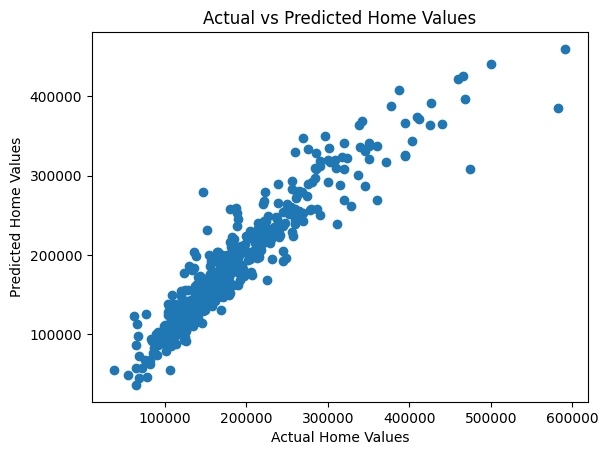

In [474]:
plt.scatter(y_comb_test, y_comb_predict);
plt.xlabel('Actual Home Values')
plt.ylabel('Predicted Home Values')
plt.title('Actual vs Predicted Home Values')

In [475]:
lr_comb.intercept_

-108824.80244252595

In [476]:
print(lr_comb.coef_.shape)
lr_comb.coef_

(92,)


array([ 5.75186513e-01,  9.17099575e+03,  2.43199790e+01,  9.78465435e+03,
        3.38695658e+03,  5.83078896e+03, -9.25790286e+02,  1.49577825e+01,
        1.27015449e+01,  2.74379754e+03, -1.09764768e+00,  5.23600270e+01,
       -1.05929440e+03,  7.78142555e+03, -1.46139423e+02,  6.76981509e+02,
        1.50285579e+03,  1.65851997e+03,  4.16453146e+02,  2.30972185e+01,
        3.09577216e+01, -3.37728489e+00, -2.18055419e+02, -1.33968942e+02,
        1.12546412e+01, -5.99338623e+03,  5.61436736e+03,  2.69930896e+04,
        4.94905651e+04,  2.49490708e+04,  1.76603208e+04,  1.40625708e+04,
        2.17484012e+04,  1.91292557e+04,  1.41865898e+03, -1.33743075e+04,
       -1.23628461e+04,  1.82640313e+04, -8.48651257e+03, -9.94428780e+03,
        6.07728787e+02,  1.22807368e+05, -1.79072588e+03,  2.41925591e-10,
        2.23613113e+04, -6.99644864e+03, -5.89759167e+03,  2.61498447e+04,
       -1.09421830e+04,  1.46284832e+04,  2.97195774e+04, -3.82730544e+03,
       -7.41871254e+03, -

In [477]:
print(X_comb.columns.shape)
X_comb.columns

(92,)


Index(['lot_area', 'overall_qual', 'mas_vnr_area', 'exter_qual', 'bsmt_qual',
       'bsmt_exposure', 'bsmtfin_type_1', 'bsmtfin_sf_1', 'total_bsmt_sf',
       'heating_qc', '1st_flr_sf', 'gr_liv_area', 'full_bath', 'kitchen_qual',
       'totrms_abvgrd', 'fireplaces', 'fireplace_qu', 'garage_finish',
       'garage_cars', 'garage_area', 'wood_deck_sf', 'open_porch_sf',
       'age_at_sale', 'age_since_remod', 'bsmnt_fin_sf', 'has_wood_deck',
       'ms_zoning_C (all)', 'ms_zoning_FV', 'ms_zoning_I (all)',
       'ms_zoning_RH', 'ms_zoning_RL', 'ms_zoning_RM', 'neighborhood_Blueste',
       'neighborhood_BrDale', 'neighborhood_BrkSide', 'neighborhood_ClearCr',
       'neighborhood_CollgCr', 'neighborhood_Crawfor', 'neighborhood_Edwards',
       'neighborhood_Gilbert', 'neighborhood_Greens', 'neighborhood_GrnHill',
       'neighborhood_IDOTRR', 'neighborhood_Landmrk', 'neighborhood_MeadowV',
       'neighborhood_Mitchel', 'neighborhood_NAmes', 'neighborhood_NPkVill',
       'neighborhoo

### In this model, the features that have the most impact on increasing the sale price are being in the neighborhood Green Hills, Stone Brook, and zoned for industrial, all other things being held equal.

Being in the Green Hill neighborhood increases the sale price by $117,447 over being in the Bloomington Heights neighborhood, all other things being held equal.

Being zoned for Stone Brook neighborhood increases the sale price by $55,482 over being in the Bloomington Heights neighborhood, all other things being held equal.

Being zoned for industrial increases the sale price by $37,800 over being zoned for agriculture, all other things being held equal

In [478]:
pd.DataFrame(data = lr_comb.coef_, 
             index = X_comb.columns, 
             columns = ['Coefficients']).sort_values('Coefficients', ascending = False)

,Coefficients
neighborhood_GrnHill,"122,807.4"
neighborhood_StoneBr,"60,478.3"
ms_zoning_I (all),"49,490.6"
neighborhood_NridgHt,"29,719.6"
ms_zoning_FV,"26,993.1"
neighborhood_NPkVill,"26,149.8"
ms_zoning_RH,"24,949.1"
foundation_Slab,"23,962.0"
neighborhood_MeadowV,"22,361.3"
neighborhood_Blueste,"21,748.4"


### Ridge & Lasso Models

In [479]:
#Using a standard scale with Ridge

In [480]:
sc_comb = StandardScaler()

In [481]:
X_comb_train.head(5)

,lot_area,overall_qual,mas_vnr_area,exter_qual,bsmt_qual,bsmt_exposure,bsmtfin_type_1,bsmtfin_sf_1,total_bsmt_sf,heating_qc,1st_flr_sf,gr_liv_area,full_bath,kitchen_qual,totrms_abvgrd,fireplaces,fireplace_qu,garage_finish,garage_cars,garage_area,wood_deck_sf,open_porch_sf,age_at_sale,age_since_remod,bsmnt_fin_sf,has_wood_deck,ms_zoning_C (all),ms_zoning_FV,ms_zoning_I (all),ms_zoning_RH,ms_zoning_RL,ms_zoning_RM,neighborhood_Blueste,neighborhood_BrDale,neighborhood_BrkSide,neighborhood_ClearCr,neighborhood_CollgCr,neighborhood_Crawfor,neighborhood_Edwards,neighborhood_Gilbert,neighborhood_Greens,neighborhood_GrnHill,neighborhood_IDOTRR,neighborhood_Landmrk,neighborhood_MeadowV,neighborhood_Mitchel,neighborhood_NAmes,neighborhood_NPkVill,neighborhood_NWAmes,neighborhood_NoRidge,neighborhood_NridgHt,neighborhood_OldTown,neighborhood_SWISU,neighborhood_Sawyer,neighborhood_SawyerW,neighborhood_Somerst,neighborhood_StoneBr,neighborhood_Timber,neighborhood_Veenker,bldg_type_2fmCon,bldg_type_Duplex,bldg_type_Twnhs,bldg_type_TwnhsE,house_style_1.5Unf,house_style_1Story,house_style_2.5Fin,house_style_2.5Unf,house_style_2Story,house_style_SFoyer,house_style_SLvl,foundation_CBlock,foundation_PConc,foundation_Slab,foundation_Stone,foundation_Wood,garage_type_Attchd,garage_type_Basment,garage_type_BuiltIn,garage_type_CarPort,garage_type_Detchd,garage_type_None,mo_sold_10,mo_sold_11,mo_sold_12,mo_sold_2,mo_sold_3,mo_sold_4,mo_sold_5,mo_sold_6,mo_sold_7,mo_sold_8,mo_sold_9
566,11777,5,97.0,3,3,3,2,328.0,"1,164.0",5,1320,1320,1,3,6,2,2,2,2.0,564.0,160,68,40,40,879.0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
1952,8918,6,0.0,4,4,3,1,0.0,745.0,5,745,1490,2,4,7,1,4,3,2.0,392.0,36,20,4,3,0.0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
72,8910,6,0.0,3,3,2,5,655.0,655.0,5,1194,1194,1,3,6,1,2,3,2.0,539.0,0,0,47,47,655.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1760,12518,5,182.0,3,3,1,5,532.0,"1,008.0",4,1008,1008,1,4,6,0,0,1,1.0,384.0,144,0,41,41,532.0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
205,6240,5,0.0,3,3,1,3,276.0,528.0,4,548,1040,1,3,5,0,0,3,2.0,624.0,306,0,74,30,276.0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0


In [482]:
Z_comb_train = sc_comb.fit_transform(X_comb_train)
Z_comb_test = sc_comb.transform(X_comb_test)
    # Changed this so I just transform the test set - NEVER fit the test set.

In [483]:
Z_comb_train.shape, Z_comb_test.shape, y_comb_train.shape, y_comb_test.shape

((1536, 92), (513, 92), (1536,), (513,))

In [484]:
Z_comb_train

array([[ 0.27288582, -0.77008369, -0.00625861, ..., -0.41319694,
        -0.28847148, -0.24652278],
       [-0.17382922, -0.06600717, -0.56496603, ...,  2.42015348,
        -0.28847148, -0.24652278],
       [-0.17507921, -0.06600717, -0.56496603, ...,  2.42015348,
        -0.28847148, -0.24652278],
       ...,
       [ 0.5461648 , -0.77008369,  0.09165919, ..., -0.41319694,
        -0.28847148, -0.24652278],
       [ 0.64694521,  0.63806934, -0.56496603, ..., -0.41319694,
        -0.28847148, -0.24652278],
       [-0.77507423,  1.34214585, -0.56496603, ..., -0.41319694,
         3.46654715, -0.24652278]])

In [485]:
Z_comb_test

array([[-0.0502365 ,  1.34214585,  0.12621841, ..., -0.41319694,
        -0.28847148,  4.05642028],
       [-0.27820336, -0.77008369, -0.56496603, ..., -0.41319694,
        -0.28847148, -0.24652278],
       [16.42462666,  0.63806934,  1.45674844, ..., -0.41319694,
        -0.28847148, -0.24652278],
       ...,
       [ 0.33976026, -2.17823671, -0.56496603, ..., -0.41319694,
        -0.28847148, -0.24652278],
       [-1.09850904, -0.77008369, -0.56496603, ..., -0.41319694,
        -0.28847148,  4.05642028],
       [-1.07007178,  1.34214585, -0.4728081 , ..., -0.41319694,
        -0.28847148, -0.24652278]])

In [486]:
ridge = Ridge()

ridge.fit(Z_comb_train, y_comb_train)

Ridge()

In [487]:
print(f'Training Score: {ridge.score(Z_comb_train, y_comb_train)}')
print(f'Testing Score: {ridge.score(Z_comb_test, y_comb_test)}')

Training Score: 0.914547111687094
Testing Score: 0.8835461207213833


In [488]:
# Changed alphas to get 200 between 0 and 100
alphas = np.logspace(0, 100, 200)
ridge_cv = RidgeCV(alphas = alphas, cv = 5)
ridge_cv.fit(Z_comb_train, y_comb_train)

RidgeCV(alphas=array([1.00000000e+000, 3.18062569e+000, 1.01163798e+001, 3.21764175e+001,
       1.02341140e+002, 3.25508860e+002, 1.03532184e+003, 3.29297126e+003,
       1.04737090e+004, 3.33129479e+004, 1.05956018e+005, 3.37006433e+005,
       1.07189132e+006, 3.40928507e+006, 1.08436597e+007, 3.44896226e+007,
       1.09698580e+008, 3.48910121e+008, 1.10975250e+009, 3.52970730e+009,
       1.122667...
       2.76828663e+088, 8.80488358e+088, 2.80050389e+089, 8.90735464e+089,
       2.83309610e+090, 9.01101825e+090, 2.86606762e+091, 9.11588830e+091,
       2.89942285e+092, 9.22197882e+092, 2.93316628e+093, 9.32930403e+093,
       2.96730241e+094, 9.43787828e+094, 3.00183581e+095, 9.54771611e+095,
       3.03677112e+096, 9.65883224e+096, 3.07211300e+097, 9.77124154e+097,
       3.10786619e+098, 9.88495905e+098, 3.14403547e+099, 1.00000000e+100]),
        cv=5)

In [489]:
#Looking at alphas to see the distribution
alphas

array([1.00000000e+000, 3.18062569e+000, 1.01163798e+001, 3.21764175e+001,
       1.02341140e+002, 3.25508860e+002, 1.03532184e+003, 3.29297126e+003,
       1.04737090e+004, 3.33129479e+004, 1.05956018e+005, 3.37006433e+005,
       1.07189132e+006, 3.40928507e+006, 1.08436597e+007, 3.44896226e+007,
       1.09698580e+008, 3.48910121e+008, 1.10975250e+009, 3.52970730e+009,
       1.12266777e+010, 3.57078596e+010, 1.13573336e+011, 3.61234270e+011,
       1.14895100e+012, 3.65438307e+012, 1.16232247e+013, 3.69691271e+013,
       1.17584955e+014, 3.73993730e+014, 1.18953407e+015, 3.78346262e+015,
       1.20337784e+016, 3.82749448e+016, 1.21738273e+017, 3.87203878e+017,
       1.23155060e+018, 3.91710149e+018, 1.24588336e+019, 3.96268864e+019,
       1.26038293e+020, 4.00880633e+020, 1.27505124e+021, 4.05546074e+021,
       1.28989026e+022, 4.10265811e+022, 1.30490198e+023, 4.15040476e+023,
       1.32008840e+024, 4.19870708e+024, 1.33545156e+025, 4.24757155e+025,
       1.35099352e+026, 4

In [490]:
#This is the optimal value of alpha
ridge_cv.alpha_

32.176417502507356

In [491]:
ridge_cv.best_score_

0.8973833493818126

In [492]:
print(f'Training score with ridge cv: {ridge_cv.score(Z_comb_train, y_comb_train)}')
print(f'Testing score with ridge cv: {ridge_cv.score(Z_comb_test, y_comb_test)}')

Training score with ridge cv: 0.9140392688508168
Testing score with ridge cv: 0.8840263208578747


In [493]:
cross_val_score(ridge_cv, Z_comb_train, y_comb_train).mean()

0.8962863489442062

In [494]:
y_ridge_predict = lr_comb.predict(Z_comb_test)
ridge_rmse = metrics.mean_squared_error(y_comb_test, y_ridge_predict, squared = False)
ridge_rmse

C:\Users\david\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


309891.0271205329

#### Lasso Regression

In [495]:
#Set up list of Lasso alphas to check
l_alphas = np.logspace(-10, 0, 200)

In [496]:
l_alphas

array([1.00000000e-10, 1.12266777e-10, 1.26038293e-10, 1.41499130e-10,
       1.58856513e-10, 1.78343088e-10, 2.00220037e-10, 2.24780583e-10,
       2.52353917e-10, 2.83309610e-10, 3.18062569e-10, 3.57078596e-10,
       4.00880633e-10, 4.50055768e-10, 5.05263107e-10, 5.67242607e-10,
       6.36824994e-10, 7.14942899e-10, 8.02643352e-10, 9.01101825e-10,
       1.01163798e-09, 1.13573336e-09, 1.27505124e-09, 1.43145894e-09,
       1.60705282e-09, 1.80418641e-09, 2.02550194e-09, 2.27396575e-09,
       2.55290807e-09, 2.86606762e-09, 3.21764175e-09, 3.61234270e-09,
       4.05546074e-09, 4.55293507e-09, 5.11143348e-09, 5.73844165e-09,
       6.44236351e-09, 7.23263390e-09, 8.11984499e-09, 9.11588830e-09,
       1.02341140e-08, 1.14895100e-08, 1.28989026e-08, 1.44811823e-08,
       1.62575567e-08, 1.82518349e-08, 2.04907469e-08, 2.30043012e-08,
       2.58261876e-08, 2.89942285e-08, 3.25508860e-08, 3.65438307e-08,
       4.10265811e-08, 4.60592204e-08, 5.17092024e-08, 5.80522552e-08,
      

In [497]:
#Cross validate over our list of Lasso alphas
lasso_cv = LassoCV(alphas = l_alphas)

In [498]:
#Fit model using the mest ridge alpha
lasso_cv.fit(Z_comb_train, y_comb_train)

C:\Users\david\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:617: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6955245624.344482, tolerance: 737980720.9718295
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\david\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:617: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6949835738.299377, tolerance: 737980720.9718295
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\david\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:617: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6945051851.915894, tolerance: 737980720.9718295
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\david\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:617: Co

LassoCV(alphas=array([1.00000000e-10, 1.12266777e-10, 1.26038293e-10, 1.41499130e-10,
       1.58856513e-10, 1.78343088e-10, 2.00220037e-10, 2.24780583e-10,
       2.52353917e-10, 2.83309610e-10, 3.18062569e-10, 3.57078596e-10,
       4.00880633e-10, 4.50055768e-10, 5.05263107e-10, 5.67242607e-10,
       6.36824994e-10, 7.14942899e-10, 8.02643352e-10, 9.01101825e-10,
       1.01163798e-09, 1.13573336e-0...
       6.98587975e-02, 7.84282206e-02, 8.80488358e-02, 9.88495905e-02,
       1.10975250e-01, 1.24588336e-01, 1.39871310e-01, 1.57029012e-01,
       1.76291412e-01, 1.97916687e-01, 2.22194686e-01, 2.49450814e-01,
       2.80050389e-01, 3.14403547e-01, 3.52970730e-01, 3.96268864e-01,
       4.44878283e-01, 4.99450512e-01, 5.60716994e-01, 6.29498899e-01,
       7.06718127e-01, 7.93409667e-01, 8.90735464e-01, 1.00000000e+00]))

In [499]:
#Optimal value of alpha is
lasso_cv.alpha_

1.0

In [500]:
print(lasso_cv.score(Z_comb_train, y_comb_train))
print(lasso_cv.score(Z_comb_test, y_comb_test))

0.9145498010438713
0.8834970963416725


In [501]:
cross_val_score(lasso_cv, Z_comb_train, y_comb_train).mean()

C:\Users\david\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:617: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6395679822.807373, tolerance: 633634741.2580233
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\david\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:617: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6390927410.697632, tolerance: 633634741.2580233
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\david\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:617: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6386736244.707397, tolerance: 633634741.2580233
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\david\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:617: Co

0.8960372282643869

In [502]:
lasso_coefs = lasso_cv.coef_

In [503]:
#Create a list of (features, coefficients) tuples
coef_tuples = list(zip(X_comb_train.columns, lasso_coefs))

#sort the coefficients based on the absolute value (in descending order)
sorted_coefs = sorted(coef_tuples, key = lambda x: -abs(x[1]))

for feature, coef in sorted_coefs:
    print(f"{feature}: {coef:.4f}")

gr_liv_area: 25504.1173
overall_qual: 13040.1997
bldg_type_TwnhsE: -8819.7901
neighborhood_StoneBr: 8252.4018
neighborhood_NridgHt: 7199.0738
bldg_type_Twnhs: -6818.8785
bsmtfin_sf_1: 6669.3296
age_at_sale: -6621.0906
bsmt_exposure: 6300.6730
ms_zoning_RL: 6173.2621
exter_qual: 5763.1124
garage_type_Detchd: 5433.5399
total_bsmt_sf: 5379.1189
bsmnt_fin_sf: 5306.6927
ms_zoning_FV: 5171.2269
kitchen_qual: 5169.3913
garage_area: 4879.2869
neighborhood_GrnHill: 4431.8700
garage_type_None: 4316.8384
mas_vnr_area: 4222.6744
garage_type_Attchd: 4185.9170
ms_zoning_RM: 4063.5288
wood_deck_sf: 4025.6657
lot_area: 3676.2538
neighborhood_Crawfor: 3485.3830
neighborhood_CollgCr: -3432.8691
house_style_1Story: 3405.6376
bldg_type_Duplex: -3163.1053
bsmt_qual: 3037.5556
has_wood_deck: -2984.1504
foundation_Slab: 2825.1379
age_since_remod: -2817.2282
fireplace_qu: 2719.6049
neighborhood_SawyerW: -2701.2824
heating_qc: 2637.7957
neighborhood_NPkVill: 2316.0033
foundation_PConc: 2283.6602
neighborhood_M

#### The features that are least important in the Lasso model are having a split level foyer, being in the Landmark neighborhood, and being zoned for industrial and commercial. 

However, since these are categorical variables it doesn't make sense to zero just them out, since wouldn't be able to zero out other variables in those categories.

In [504]:
y_lasso_predict = lasso_cv.predict(Z_comb_test)
lasso_rmse = metrics.mean_squared_error(y_comb_test, y_lasso_predict, squared = False)
lasso_rmse

27385.523941699037

#### Polynomial Features on Numeric Data

In [505]:
X_numeric.head(5)

,ms_subclass,lot_frontage,lot_area,lot_shape,land_slope,overall_qual,overall_cond,year_built,year_remod/add,mas_vnr_area,exter_qual,exter_cond,bsmt_qual,bsmt_cond,bsmt_exposure,bsmtfin_type_1,bsmtfin_sf_1,bsmtfin_type_2,bsmtfin_sf_2,bsmt_unf_sf,total_bsmt_sf,heating_qc,central_air,electrical,1st_flr_sf,2nd_flr_sf,low_qual_fin_sf,gr_liv_area,bsmt_full_bath,bsmt_half_bath,full_bath,half_bath,bedroom_abvgr,kitchen_abvgr,kitchen_qual,totrms_abvgrd,functional,fireplaces,fireplace_qu,garage_finish,garage_cars,garage_area,garage_qual,garage_cond,paved_drive,wood_deck_sf,open_porch_sf,enclosed_porch,3ssn_porch,screen_porch,pool_area,fence,misc_val,yr_sold,age_at_sale,age_since_remod,bsmnt_fin_sf,sold_in_crisis,has_wood_deck,has_pool
0,60,0.0,13517,3,3,6,8,1976,2005,289.0,4,3,3,3,1,6,533.0,1,0.0,192.0,725.0,5,1,5,725,754,0,1479,0.0,0.0,2,1,3,1,4,6,8,0,0,2,2.0,475.0,3,3,3,0,44,0,0,0,0,0,0,2010,34,5,533.0,1,0,0
1,60,43.0,11492,3,3,7,5,1996,1997,132.0,4,3,4,3,1,6,637.0,1,0.0,276.0,913.0,5,1,5,913,1209,0,2122,1.0,0.0,2,1,4,1,4,8,8,1,3,2,2.0,559.0,3,3,3,0,74,0,0,0,0,0,0,2009,13,12,637.0,1,0,0
2,20,68.0,7922,4,3,5,7,1953,2007,0.0,3,4,3,3,1,6,731.0,1,0.0,326.0,"1,057.0",3,1,5,1057,0,0,1057,1.0,0.0,1,0,3,1,4,5,8,0,0,1,1.0,246.0,3,3,3,0,52,0,0,0,0,0,0,2010,57,3,731.0,1,0,0
3,60,73.0,9802,4,3,5,5,2006,2007,0.0,3,3,4,3,1,1,0.0,1,0.0,384.0,384.0,4,1,5,744,700,0,1444,0.0,0.0,2,1,3,1,3,7,8,0,0,3,2.0,400.0,3,3,3,100,0,0,0,0,0,0,0,2010,4,3,0.0,1,1,0
4,50,82.0,14235,3,3,6,8,1900,1993,0.0,3,3,2,4,1,1,0.0,1,0.0,676.0,676.0,3,1,5,831,614,0,1445,0.0,0.0,2,0,3,1,3,6,8,0,0,1,2.0,484.0,3,3,1,0,59,0,0,0,0,0,0,2010,110,17,0.0,1,0,0


In [506]:
#Train test split on numeric data
X_numeric_train, X_numeric_test, y_numeric_train, y_numeric_test = train_test_split(X_numeric, y)

In [507]:
# Call polynomial features model
poly = PolynomialFeatures(degree = 2, interaction_only = False, include_bias = False)

In [508]:
# Fit transform 
X_numeric_overfit_train = poly.fit_transform(X_numeric_train)

In [509]:
# Transform Test Data
X_numeric_overfit_test = poly.transform(X_numeric_test)

In [510]:
# Checking shape of polynomial features - ends up with 1,890 columns
X_numeric_overfit_train.shape, X_numeric_overfit_test.shape, y_numeric_train.shape, y_numeric_test.shape

((1536, 1890), (513, 1890), (1536,), (513,))

In [511]:
# Looking at list of columns in polynomial features
poly.get_feature_names_out(X_numeric.columns)
    # The name of the data set in get_feature_names_out is the name of the data set BEFORE you run the polynomial features

array(['ms_subclass', 'lot_frontage', 'lot_area', ..., 'has_wood_deck^2',
       'has_wood_deck has_pool', 'has_pool^2'], dtype=object)

In [512]:
sc = StandardScaler()

Z_overfit_train = sc.fit_transform(X_numeric_overfit_train)
Z_overfit_test = sc.transform(X_numeric_overfit_test)

In [513]:
ols_overfit = LinearRegression()
ols_overfit.fit(Z_overfit_train, y_numeric_train)

LinearRegression()

In [514]:
print(f'Training Score: {ols_overfit.score(Z_overfit_train, y_numeric_train)}')
print(f'Testing Score: {ols_overfit.score(Z_overfit_test, y_numeric_test)}')

Training Score: 0.9965642397108875
Testing Score: -2.3501596273722106e+19


#### Using polynomial features trains the model well, but very overfit and does not predict testing data set well.

In [515]:
cross_val_score(ols_overfit, Z_overfit_train, y_numeric_train).mean()

-2835073095214.378

In [516]:
#Instantiate Ridge
ridge = Ridge()

#Set up list of ridge alphas to check - changed to 0 to 100 in 200 increments
alphas = np.logspace(0, 100, 100)

ridge_overfit_cv = RidgeCV(alphas = alphas, cv = 5)

ridge_overfit_cv.fit(Z_overfit_train, y_numeric_train)


RidgeCV(alphas=array([1.00000000e+000, 1.02353102e+001, 1.04761575e+002, 1.07226722e+003,
       1.09749877e+004, 1.12332403e+005, 1.14975700e+006, 1.17681195e+007,
       1.20450354e+008, 1.23284674e+009, 1.26185688e+010, 1.29154967e+011,
       1.32194115e+012, 1.35304777e+013, 1.38488637e+014, 1.41747416e+015,
       1.45082878e+016, 1.48496826e+017, 1.51991108e+018, 1.55567614e+019,
       1.592282...
       5.85702082e+076, 5.99484250e+077, 6.13590727e+078, 6.28029144e+079,
       6.42807312e+080, 6.57933225e+081, 6.73415066e+082, 6.89261210e+083,
       7.05480231e+084, 7.22080902e+085, 7.39072203e+086, 7.56463328e+087,
       7.74263683e+088, 7.92482898e+089, 8.11130831e+090, 8.30217568e+091,
       8.49753436e+092, 8.69749003e+093, 8.90215085e+094, 9.11162756e+095,
       9.32603347e+096, 9.54548457e+097, 9.77009957e+098, 1.00000000e+100]),
        cv=5)

In [517]:
ridge_overfit_cv.alpha_

1072.2672220103232

In [518]:
ridge_overfit_cv.best_score_

0.9239937777238495

In [519]:
print(f'Training Score with ridge cv: {ridge_overfit_cv.score(Z_overfit_train, y_numeric_train)}')
print(f'Training Score with ridge cv: {ridge_overfit_cv.score(Z_overfit_test, y_numeric_test)}')

Training Score with ridge cv: 0.9456803705721483
Training Score with ridge cv: 0.9200554028391409


In [520]:
# Taking too long to run
cross_val_score(ridge_overfit_cv, Z_overfit_train, y_numeric_train).mean()

0.9239937777238495

In [571]:
ridge_overfit_cv.coef_
    #Multiply coefficients by StD and then add the mean to return them to interpretable units - Rowan helped me with this

array([-47.4903787 , -76.16752876, 128.83884834, ..., -46.25459614,
        95.05089869,  -4.74956641])

In [572]:
sc.mean_
    # Mean of standard scaler

array([5.75651042e+01, 5.72845052e+01, 9.88035938e+03, ...,
       4.75260417e-01, 3.25520833e-03, 3.90625000e-03])

In [573]:
sc.scale_

array([4.31981075e+01, 3.29282351e+01, 6.13260161e+03, ...,
       4.99387578e-01, 5.69614953e-02, 6.23778102e-02])

In [574]:
#Re-scaling coefficients back in dollars
coefs_dollars = (ridge_overfit_cv.coef_ * sc.scale_) + sc.mean_
coefs_dollars

array([-1.99392938e+03, -2.45077779e+03,  7.99997688e+05, ...,
       -2.26237103e+01,  5.41749653e+00, -2.92361302e-01])

In [522]:
y_ridge_overfit_preds = ridge_overfit_cv.predict(Z_overfit_test)
y_ridge_overfit_preds

array([322790.44958165, 113124.86191678, 166085.39197797, 140738.35296566,
       140837.59837086, 153428.71945868, 212234.98892313, 192180.87776719,
       175537.94824311,  73433.26890165, 167508.53751153, 204321.60591877,
       359472.46824876, 142115.80808231,  98457.68052861, 127921.76806799,
       188245.77912059, 211216.94050263, 141566.96522595, 175930.7072983 ,
       144026.84052101, 184520.94114581, 132055.08590856, 129958.33561365,
       101438.90687445, 161663.15552782, 189587.56886265, 201779.6548404 ,
       214261.94946697, 130208.38866658, 171795.22064119, 201172.54997976,
       200435.92120558, 130322.53068299, 236609.94998966, 182950.69366248,
       118746.95148456, 126485.23339455, 262150.79840168, 384957.3354362 ,
       154528.93949142, 104923.17164129, 222841.60248312, 147230.26925174,
       375083.64881075, 154478.19915647, 200649.5362667 , 244778.28036125,
       160964.30698053, 325168.54828028, 151173.50563792, 165759.16526744,
       209878.61454678,  

In [523]:
ridge_overfit_rmse = metrics.mean_squared_error(y_numeric_test, y_ridge_overfit_preds, squared = False)
ridge_overfit_rmse

24960.533989038442

In [564]:
# Coefficients ranked by standard deviation
pd.DataFrame(data = ridge_overfit_cv.coef_,
             index = poly.get_feature_names_out(X_numeric.columns),
             columns = ['Coefficients']).sort_values('Coefficients', ascending = False)

,Coefficients
mas_vnr_area half_bath,"1,074.5"
overall_qual gr_liv_area,"1,057.5"
overall_qual^2,"1,027.4"
overall_qual 1st_flr_sf,"1,020.5"
exter_qual 1st_flr_sf,915.0
mas_vnr_area 2nd_flr_sf,864.2
exter_qual gr_liv_area,831.3
overall_qual total_bsmt_sf,830.1
1st_flr_sf kitchen_qual,826.9
overall_qual kitchen_qual,819.6


In [578]:
#Looking at the units for these metrics
print(df['lot_area'].median() )
df['gr_liv_area'].median()

9405.0


1444.0

In [576]:
pd.DataFrame(data = coefs_dollars,
             index = poly.get_feature_names_out(X_numeric.columns),
             columns = ['Coefficients']).sort_values('Coefficients', ascending = False)

,Coefficients
lot_area gr_liv_area,"2,821,861,573.4"
lot_area 2nd_flr_sf,"1,990,162,244.4"
lot_area year_built,"1,712,548,136.0"
lot_area yr_sold,"1,612,824,938.5"
lot_area year_remod/add,"1,573,790,648.1"
gr_liv_area^2,"1,108,433,034.9"
lot_area bsmnt_fin_sf,"773,733,984.1"
lot_area 1st_flr_sf,"742,055,753.7"
1st_flr_sf gr_liv_area,"640,635,619.1"
total_bsmt_sf gr_liv_area,"628,384,873.9"


#### In this model using polynomial features, the features that have the most impact on increasing the sale price of the house are:

-- Lot Area in Square Feet multiplied by Above Grade (Ground) Living Area in Square Feet

-- Lot Area in Square Feet multiplied by Second Floor Area in Square Feet

-- Lot Area in Square Feet multiplied by the Year Built

#### Lasso on Polynomial Features -- Takes too long to run, ignore

In [524]:
 
# l_alphas = np.logspace(-3, 0, 100)

# lasso_overfit_cv = LassoCV(alphas = l_alphas)

# lasso_overfit_cv.fit(Z_overfit_train, y_overfit_train)

# lasso_cv.alpha_

#### Combine All Numeric Features and Some Categorical Features

In [525]:
all_numeric_some_cat = df[numeric_data_cols + fewer_cat_col_name]
all_numeric_some_cat.head()
all_numeric_some_cat.isnull().sum()

id                   0
pid                  0
ms_subclass          0
lot_frontage         0
lot_area             0
lot_shape            0
land_slope           0
overall_qual         0
overall_cond         0
year_built           0
year_remod/add       0
mas_vnr_area         0
exter_qual           0
exter_cond           0
bsmt_qual            0
bsmt_cond            0
bsmt_exposure        0
bsmtfin_type_1       0
bsmtfin_sf_1         0
bsmtfin_type_2       0
bsmtfin_sf_2         0
bsmt_unf_sf          0
total_bsmt_sf        0
heating_qc           0
central_air          0
electrical           0
1st_flr_sf           0
2nd_flr_sf           0
low_qual_fin_sf      0
gr_liv_area          0
bsmt_full_bath       0
bsmt_half_bath       0
full_bath            0
half_bath            0
bedroom_abvgr        0
kitchen_abvgr        0
kitchen_qual         0
totrms_abvgrd        0
functional           0
fireplaces           0
fireplace_qu         0
garage_yr_blt      114
garage_finish        0
garage_cars

In [526]:
all_numeric_some_cat['neighborhood'].value_counts()

neighborhood
NAmes      310
CollgCr    180
OldTown    163
Edwards    141
Somerst    130
NridgHt    122
Gilbert    116
Sawyer     111
NWAmes      87
SawyerW     87
Mitchel     82
BrkSide     76
Crawfor     71
IDOTRR      69
NoRidge     48
Timber      48
StoneBr     38
SWISU       32
ClearCr     27
MeadowV     24
Blmngtn     22
BrDale      19
Veenker     17
NPkVill     17
Blueste      6
Greens       3
GrnHill      2
Landmrk      1
Name: count, dtype: int64

In [527]:
drop_cols = ['garage_yr_blt', 'id', 'pid', 'saleprice']
filtered_df = all_numeric_some_cat.drop(columns = drop_cols)
filtered_df.head()

,ms_subclass,lot_frontage,lot_area,lot_shape,land_slope,overall_qual,overall_cond,year_built,year_remod/add,mas_vnr_area,exter_qual,exter_cond,bsmt_qual,bsmt_cond,bsmt_exposure,bsmtfin_type_1,bsmtfin_sf_1,bsmtfin_type_2,bsmtfin_sf_2,bsmt_unf_sf,total_bsmt_sf,heating_qc,central_air,electrical,1st_flr_sf,2nd_flr_sf,low_qual_fin_sf,gr_liv_area,bsmt_full_bath,bsmt_half_bath,full_bath,half_bath,bedroom_abvgr,kitchen_abvgr,kitchen_qual,totrms_abvgrd,functional,fireplaces,fireplace_qu,garage_finish,garage_cars,garage_area,garage_qual,garage_cond,paved_drive,wood_deck_sf,open_porch_sf,enclosed_porch,3ssn_porch,screen_porch,pool_area,fence,misc_val,yr_sold,age_at_sale,age_since_remod,bsmnt_fin_sf,sold_in_crisis,has_wood_deck,has_pool,ms_zoning,neighborhood,bldg_type,house_style,foundation,garage_type,mo_sold
0,60,0.0,13517,3,3,6,8,1976,2005,289.0,4,3,3,3,1,6,533.0,1,0.0,192.0,725.0,5,1,5,725,754,0,1479,0.0,0.0,2,1,3,1,4,6,8,0,0,2,2.0,475.0,3,3,3,0,44,0,0,0,0,0,0,2010,34,5,533.0,1,0,0,RL,Sawyer,1Fam,2Story,CBlock,Attchd,3
1,60,43.0,11492,3,3,7,5,1996,1997,132.0,4,3,4,3,1,6,637.0,1,0.0,276.0,913.0,5,1,5,913,1209,0,2122,1.0,0.0,2,1,4,1,4,8,8,1,3,2,2.0,559.0,3,3,3,0,74,0,0,0,0,0,0,2009,13,12,637.0,1,0,0,RL,SawyerW,1Fam,2Story,PConc,Attchd,4
2,20,68.0,7922,4,3,5,7,1953,2007,0.0,3,4,3,3,1,6,731.0,1,0.0,326.0,"1,057.0",3,1,5,1057,0,0,1057,1.0,0.0,1,0,3,1,4,5,8,0,0,1,1.0,246.0,3,3,3,0,52,0,0,0,0,0,0,2010,57,3,731.0,1,0,0,RL,NAmes,1Fam,1Story,CBlock,Detchd,1
3,60,73.0,9802,4,3,5,5,2006,2007,0.0,3,3,4,3,1,1,0.0,1,0.0,384.0,384.0,4,1,5,744,700,0,1444,0.0,0.0,2,1,3,1,3,7,8,0,0,3,2.0,400.0,3,3,3,100,0,0,0,0,0,0,0,2010,4,3,0.0,1,1,0,RL,Timber,1Fam,2Story,PConc,BuiltIn,4
4,50,82.0,14235,3,3,6,8,1900,1993,0.0,3,3,2,4,1,1,0.0,1,0.0,676.0,676.0,3,1,5,831,614,0,1445,0.0,0.0,2,0,3,1,3,6,8,0,0,1,2.0,484.0,3,3,1,0,59,0,0,0,0,0,0,2010,110,17,0.0,1,0,0,RL,SawyerW,1Fam,1.5Fin,PConc,Detchd,3


In [528]:
filtered_dums = pd.get_dummies(filtered_df, dtype = int, 
                         sparse = False, 
                         drop_first = True)
filtered_dums.head()

,ms_subclass,lot_frontage,lot_area,lot_shape,land_slope,overall_qual,overall_cond,year_built,year_remod/add,mas_vnr_area,exter_qual,exter_cond,bsmt_qual,bsmt_cond,bsmt_exposure,bsmtfin_type_1,bsmtfin_sf_1,bsmtfin_type_2,bsmtfin_sf_2,bsmt_unf_sf,total_bsmt_sf,heating_qc,central_air,electrical,1st_flr_sf,2nd_flr_sf,low_qual_fin_sf,gr_liv_area,bsmt_full_bath,bsmt_half_bath,full_bath,half_bath,bedroom_abvgr,kitchen_abvgr,kitchen_qual,totrms_abvgrd,functional,fireplaces,fireplace_qu,garage_finish,garage_cars,garage_area,garage_qual,garage_cond,paved_drive,wood_deck_sf,open_porch_sf,enclosed_porch,3ssn_porch,screen_porch,pool_area,fence,misc_val,yr_sold,age_at_sale,age_since_remod,bsmnt_fin_sf,sold_in_crisis,has_wood_deck,has_pool,ms_zoning_C (all),ms_zoning_FV,ms_zoning_I (all),ms_zoning_RH,ms_zoning_RL,ms_zoning_RM,neighborhood_Blueste,neighborhood_BrDale,neighborhood_BrkSide,neighborhood_ClearCr,neighborhood_CollgCr,neighborhood_Crawfor,neighborhood_Edwards,neighborhood_Gilbert,neighborhood_Greens,neighborhood_GrnHill,neighborhood_IDOTRR,neighborhood_Landmrk,neighborhood_MeadowV,neighborhood_Mitchel,neighborhood_NAmes,neighborhood_NPkVill,neighborhood_NWAmes,neighborhood_NoRidge,neighborhood_NridgHt,neighborhood_OldTown,neighborhood_SWISU,neighborhood_Sawyer,neighborhood_SawyerW,neighborhood_Somerst,neighborhood_StoneBr,neighborhood_Timber,neighborhood_Veenker,bldg_type_2fmCon,bldg_type_Duplex,bldg_type_Twnhs,bldg_type_TwnhsE,house_style_1.5Unf,house_style_1Story,house_style_2.5Fin,house_style_2.5Unf,house_style_2Story,house_style_SFoyer,house_style_SLvl,foundation_CBlock,foundation_PConc,foundation_Slab,foundation_Stone,foundation_Wood,garage_type_Attchd,garage_type_Basment,garage_type_BuiltIn,garage_type_CarPort,garage_type_Detchd,garage_type_None,mo_sold_10,mo_sold_11,mo_sold_12,mo_sold_2,mo_sold_3,mo_sold_4,mo_sold_5,mo_sold_6,mo_sold_7,mo_sold_8,mo_sold_9
0,60,0.0,13517,3,3,6,8,1976,2005,289.0,4,3,3,3,1,6,533.0,1,0.0,192.0,725.0,5,1,5,725,754,0,1479,0.0,0.0,2,1,3,1,4,6,8,0,0,2,2.0,475.0,3,3,3,0,44,0,0,0,0,0,0,2010,34,5,533.0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1,60,43.0,11492,3,3,7,5,1996,1997,132.0,4,3,4,3,1,6,637.0,1,0.0,276.0,913.0,5,1,5,913,1209,0,2122,1.0,0.0,2,1,4,1,4,8,8,1,3,2,2.0,559.0,3,3,3,0,74,0,0,0,0,0,0,2009,13,12,637.0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
2,20,68.0,7922,4,3,5,7,1953,2007,0.0,3,4,3,3,1,6,731.0,1,0.0,326.0,"1,057.0",3,1,5,1057,0,0,1057,1.0,0.0,1,0,3,1,4,5,8,0,0,1,1.0,246.0,3,3,3,0,52,0,0,0,0,0,0,2010,57,3,731.0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
3,60,73.0,9802,4,3,5,5,2006,2007,0.0,3,3,4,3,1,1,0.0,1,0.0,384.0,384.0,4,1,5,744,700,0,1444,0.0,0.0,2,1,3,1,3,7,8,0,0,3,2.0,400.0,3,3,3,100,0,0,0,0,0,0,0,2010,4,3,0.0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0
4,50,82.0,14235,3,3,6,8,1900,1993,0.0,3,3,2,4,1,1,0.0,1,0.0,676.0,676.0,3,1,5,831,614,0,1445,0.0,0.0,2,0,3,1,3,6,8,0,0,1,2.0,484.0,3,3,1,0,59,0,0,0,0,0,0,2010,110,17,0.0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0


In [529]:
filtered_dums.isnull().sum()

ms_subclass             0
lot_frontage            0
lot_area                0
lot_shape               0
land_slope              0
overall_qual            0
overall_cond            0
year_built              0
year_remod/add          0
mas_vnr_area            0
exter_qual              0
exter_cond              0
bsmt_qual               0
bsmt_cond               0
bsmt_exposure           0
bsmtfin_type_1          0
bsmtfin_sf_1            0
bsmtfin_type_2          0
bsmtfin_sf_2            0
bsmt_unf_sf             0
total_bsmt_sf           0
heating_qc              0
central_air             0
electrical              0
1st_flr_sf              0
2nd_flr_sf              0
low_qual_fin_sf         0
gr_liv_area             0
bsmt_full_bath          0
bsmt_half_bath          0
full_bath               0
half_bath               0
bedroom_abvgr           0
kitchen_abvgr           0
kitchen_qual            0
totrms_abvgrd           0
functional              0
fireplaces              0
fireplace_qu

In [530]:
cols_used_in_model = filtered_dums.columns.tolist


In [531]:
X_filt_num_cat = filtered_dums
y_filt_num_cat = df['saleprice']

In [532]:
X_filt_num_cat_train, X_filt_num_cat_test, y_filt_num_cat_train, y_filt_num_cat_test = train_test_split(X_filt_num_cat, y)

In [533]:
X_filt_num_cat_train.shape, X_filt_num_cat_test.shape, y_filt_num_cat_train.shape, y_filt_num_cat_test.shape

((1536, 126), (513, 126), (1536,), (513,))

In [534]:
lr_filt_num_cat = LinearRegression()

In [535]:
lr_filt_num_cat.fit(X_filt_num_cat_train, y_filt_num_cat_train)

LinearRegression()

In [536]:
lr_filt_num_cat.score(X_filt_num_cat_train, y_filt_num_cat_train)

0.9200897780570643

In [537]:
lr_filt_num_cat.score(X_filt_num_cat_test, y_filt_num_cat_test)

0.9044829852801758

In [538]:
cross_val_score(lr_filt_num_cat, X_filt_num_cat_train, y_filt_num_cat_train).mean()

0.8864312459738949

In [539]:
y_filt_num_cat_preds = lr_filt_num_cat.predict(X_filt_num_cat_test)

filt_num_cat_rmse = metrics.mean_squared_error(y_filt_num_cat_test, y_filt_num_cat_preds, squared = False)
filt_num_cat_rmse

24633.78270552644

#### In this model, the features that are have the most impact on increasing the sale price are being in the Green Hill and Stone Brook neighborhood, and having a pool, all other things being held constant.

Being in the Green Hill neighborhood increases the sales price by $112,485 relative to being in the Bloomington Heights neighborhood, all other things held constant.

Being in the Stone Brook neighborhood increases the sales price by $46,012 relative to being in the Bloomington Heights neighborhood, all other things held constant.

Having a pool increases the sales price by $42,568 over not having one, all other things being held constant.


In [540]:
pd.DataFrame(data = lr_filt_num_cat.coef_, 
             index = X_filt_num_cat.columns, 
             columns = ['Coefficients']).sort_values('Coefficients', ascending = False)

,Coefficients
neighborhood_GrnHill,"113,269.9"
has_pool,"57,428.7"
neighborhood_StoneBr,"55,981.3"
neighborhood_NridgHt,"28,491.0"
garage_type_None,"27,146.3"
neighborhood_NPkVill,"27,076.7"
neighborhood_Blueste,"22,629.5"
neighborhood_MeadowV,"18,666.4"
neighborhood_BrDale,"18,125.1"
foundation_Slab,"17,994.1"


#### Checking for LINEM on this model since it had the lowest RMSE

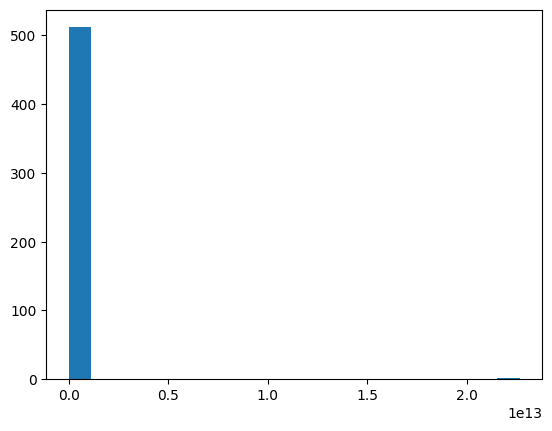

In [569]:
residuals = y_filt_num_cat_test - y_filt_num_cat_preds
plt.hist(residuals, bins = 20);

### This is not a normal distribution

In [589]:
#There is 1 residual that is throwing everything off
residuals.sort_values()

348              -140,451.8
1612              -69,619.6
429               -64,433.5
1312              -62,754.9
1146              -59,527.2
163               -59,317.0
309               -57,157.7
522               -57,107.4
1927              -57,107.3
1013              -56,844.9
192               -55,207.2
857               -51,481.7
1783              -49,857.5
1295              -49,716.9
1473              -49,151.3
965               -49,062.5
562               -48,257.7
1694              -47,517.8
951               -47,504.4
1562              -46,197.2
1740              -44,325.7
1114              -43,918.6
1413              -43,872.1
918               -40,867.4
939               -40,592.2
1944              -38,770.5
287               -38,051.1
992               -37,981.5
393               -36,867.2
903               -36,197.3
815               -36,133.6
308               -36,122.8
408               -35,613.0
1247              -34,885.6
689               -34,795.4
632               -3

In [593]:
type(residuals)

pandas.core.series.Series

In [598]:
#Dropping highest residual to plot
max_residual = residuals.idxmax() #Get the highest value in the series
residual_minus_outlier = residuals.drop(max_residual)
residual_minus_outlier.sort_values()

348    -140,451.8
1612    -69,619.6
429     -64,433.5
1312    -62,754.9
1146    -59,527.2
163     -59,317.0
309     -57,157.7
522     -57,107.4
1927    -57,107.3
1013    -56,844.9
192     -55,207.2
857     -51,481.7
1783    -49,857.5
1295    -49,716.9
1473    -49,151.3
965     -49,062.5
562     -48,257.7
1694    -47,517.8
951     -47,504.4
1562    -46,197.2
1740    -44,325.7
1114    -43,918.6
1413    -43,872.1
918     -40,867.4
939     -40,592.2
1944    -38,770.5
287     -38,051.1
992     -37,981.5
393     -36,867.2
903     -36,197.3
815     -36,133.6
308     -36,122.8
408     -35,613.0
1247    -34,885.6
689     -34,795.4
632     -34,412.2
673     -34,160.1
1437    -33,434.4
1574    -33,370.5
1178    -32,933.1
30      -32,881.4
1850    -32,752.6
1298    -31,241.9
999     -30,822.6
755     -30,773.1
392     -30,705.1
1912    -29,770.4
145     -29,618.9
994     -29,302.1
1703    -28,957.5
1000    -28,680.7
563     -28,163.7
1900    -28,035.2
1924    -27,647.6
1514    -27,643.1
845     -2

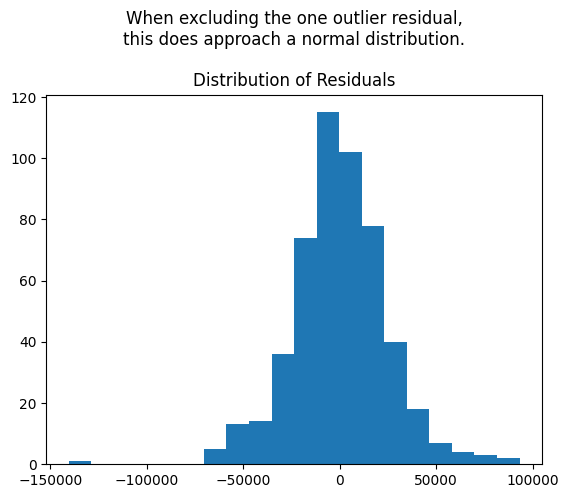

In [622]:
plt.hist(residual_minus_outlier, bins = 20)
plt.title('When excluding the one outlier residual,\nthis does approach a normal distribution.\n\nDistribution of Residuals');
    # This is somewhat approaching a normal distribution

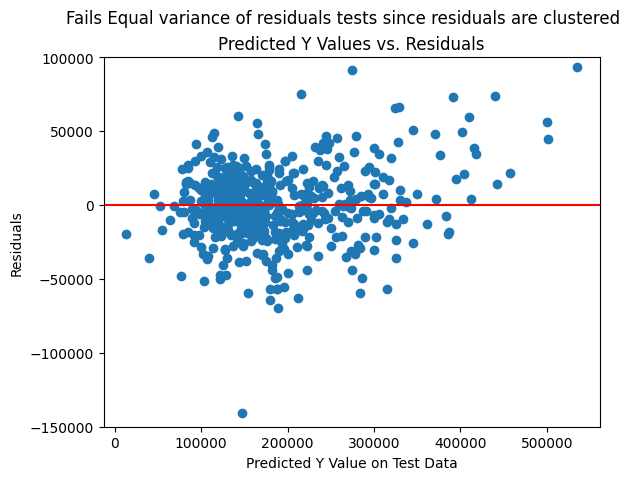

In [611]:
plt.scatter(y_filt_num_cat_test, residuals)
plt.ylim(-150_000, 100_000); #Set the y limit from -150k up to 100k so I'm excluding the outlier

plt.suptitle('Fails Equal variance of residuals tests since residuals are clustered')
plt.title('Predicted Y Values vs. Residuals')
plt.xlabel('Predicted Y Value on Test Data')
plt.ylabel('Residuals')
plt.axhline(0, color = 'red');

#### Using Standard Scaler on Combined Data

In [541]:
ss = StandardScaler()

In [542]:
X_filt_num_cat_train.shape, X_filt_num_cat_test.shape

((1536, 126), (513, 126))

In [543]:
Z_filt_num_cat_train_scale = ss.fit_transform(X_filt_num_cat_train)
Z_filt_num_cat_test_scale = ss.transform(X_filt_num_cat_test)

In [544]:
ols = LinearRegression()
ols.fit(Z_filt_num_cat_train_scale, y_filt_num_cat_train)

LinearRegression()

In [545]:
print(f'Training Score: {ols.score(Z_filt_num_cat_train_scale, y_filt_num_cat_train)}')
print(f'Testing Score: {ols.score(Z_filt_num_cat_test_scale, y_filt_num_cat_test)}')

Training Score: 0.9200921163312084
Testing Score: -157260382583251.4


In [546]:
cross_val_score(ols, Z_filt_num_cat_train_scale, y_filt_num_cat_train).mean()

-1.6997658996735696e+21

In [547]:
y_filt_num_cat_preds = ols.predict(Z_filt_num_cat_test_scale)

In [548]:
rmse_filt_num_ridge = metrics.mean_squared_error(y_filt_num_cat_test, y_filt_num_cat_preds, squared = False)
rmse_filt_num_ridge

999540509242.784

#### One more model - taking all the numeric and filtered categories, dropping sold in crisis and see what that one variable does

In [549]:
filtered_dums.head()

,ms_subclass,lot_frontage,lot_area,lot_shape,land_slope,overall_qual,overall_cond,year_built,year_remod/add,mas_vnr_area,exter_qual,exter_cond,bsmt_qual,bsmt_cond,bsmt_exposure,bsmtfin_type_1,bsmtfin_sf_1,bsmtfin_type_2,bsmtfin_sf_2,bsmt_unf_sf,total_bsmt_sf,heating_qc,central_air,electrical,1st_flr_sf,2nd_flr_sf,low_qual_fin_sf,gr_liv_area,bsmt_full_bath,bsmt_half_bath,full_bath,half_bath,bedroom_abvgr,kitchen_abvgr,kitchen_qual,totrms_abvgrd,functional,fireplaces,fireplace_qu,garage_finish,garage_cars,garage_area,garage_qual,garage_cond,paved_drive,wood_deck_sf,open_porch_sf,enclosed_porch,3ssn_porch,screen_porch,pool_area,fence,misc_val,yr_sold,age_at_sale,age_since_remod,bsmnt_fin_sf,sold_in_crisis,has_wood_deck,has_pool,ms_zoning_C (all),ms_zoning_FV,ms_zoning_I (all),ms_zoning_RH,ms_zoning_RL,ms_zoning_RM,neighborhood_Blueste,neighborhood_BrDale,neighborhood_BrkSide,neighborhood_ClearCr,neighborhood_CollgCr,neighborhood_Crawfor,neighborhood_Edwards,neighborhood_Gilbert,neighborhood_Greens,neighborhood_GrnHill,neighborhood_IDOTRR,neighborhood_Landmrk,neighborhood_MeadowV,neighborhood_Mitchel,neighborhood_NAmes,neighborhood_NPkVill,neighborhood_NWAmes,neighborhood_NoRidge,neighborhood_NridgHt,neighborhood_OldTown,neighborhood_SWISU,neighborhood_Sawyer,neighborhood_SawyerW,neighborhood_Somerst,neighborhood_StoneBr,neighborhood_Timber,neighborhood_Veenker,bldg_type_2fmCon,bldg_type_Duplex,bldg_type_Twnhs,bldg_type_TwnhsE,house_style_1.5Unf,house_style_1Story,house_style_2.5Fin,house_style_2.5Unf,house_style_2Story,house_style_SFoyer,house_style_SLvl,foundation_CBlock,foundation_PConc,foundation_Slab,foundation_Stone,foundation_Wood,garage_type_Attchd,garage_type_Basment,garage_type_BuiltIn,garage_type_CarPort,garage_type_Detchd,garage_type_None,mo_sold_10,mo_sold_11,mo_sold_12,mo_sold_2,mo_sold_3,mo_sold_4,mo_sold_5,mo_sold_6,mo_sold_7,mo_sold_8,mo_sold_9
0,60,0.0,13517,3,3,6,8,1976,2005,289.0,4,3,3,3,1,6,533.0,1,0.0,192.0,725.0,5,1,5,725,754,0,1479,0.0,0.0,2,1,3,1,4,6,8,0,0,2,2.0,475.0,3,3,3,0,44,0,0,0,0,0,0,2010,34,5,533.0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1,60,43.0,11492,3,3,7,5,1996,1997,132.0,4,3,4,3,1,6,637.0,1,0.0,276.0,913.0,5,1,5,913,1209,0,2122,1.0,0.0,2,1,4,1,4,8,8,1,3,2,2.0,559.0,3,3,3,0,74,0,0,0,0,0,0,2009,13,12,637.0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
2,20,68.0,7922,4,3,5,7,1953,2007,0.0,3,4,3,3,1,6,731.0,1,0.0,326.0,"1,057.0",3,1,5,1057,0,0,1057,1.0,0.0,1,0,3,1,4,5,8,0,0,1,1.0,246.0,3,3,3,0,52,0,0,0,0,0,0,2010,57,3,731.0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
3,60,73.0,9802,4,3,5,5,2006,2007,0.0,3,3,4,3,1,1,0.0,1,0.0,384.0,384.0,4,1,5,744,700,0,1444,0.0,0.0,2,1,3,1,3,7,8,0,0,3,2.0,400.0,3,3,3,100,0,0,0,0,0,0,0,2010,4,3,0.0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0
4,50,82.0,14235,3,3,6,8,1900,1993,0.0,3,3,2,4,1,1,0.0,1,0.0,676.0,676.0,3,1,5,831,614,0,1445,0.0,0.0,2,0,3,1,3,6,8,0,0,1,2.0,484.0,3,3,1,0,59,0,0,0,0,0,0,2010,110,17,0.0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0


In [550]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
filtered_dums.columns

Index(['ms_subclass', 'lot_frontage', 'lot_area', 'lot_shape', 'land_slope',
       'overall_qual', 'overall_cond', 'year_built', 'year_remod/add',
       'mas_vnr_area',
       ...
       'mo_sold_11', 'mo_sold_12', 'mo_sold_2', 'mo_sold_3', 'mo_sold_4',
       'mo_sold_5', 'mo_sold_6', 'mo_sold_7', 'mo_sold_8', 'mo_sold_9'],
      dtype='object', length=126)

In [551]:
filtered_dums.head()

,ms_subclass,lot_frontage,lot_area,lot_shape,land_slope,overall_qual,overall_cond,year_built,year_remod/add,mas_vnr_area,exter_qual,exter_cond,bsmt_qual,bsmt_cond,bsmt_exposure,bsmtfin_type_1,bsmtfin_sf_1,bsmtfin_type_2,bsmtfin_sf_2,bsmt_unf_sf,total_bsmt_sf,heating_qc,central_air,electrical,1st_flr_sf,2nd_flr_sf,low_qual_fin_sf,gr_liv_area,bsmt_full_bath,bsmt_half_bath,full_bath,half_bath,bedroom_abvgr,kitchen_abvgr,kitchen_qual,totrms_abvgrd,functional,fireplaces,fireplace_qu,garage_finish,garage_cars,garage_area,garage_qual,garage_cond,paved_drive,wood_deck_sf,open_porch_sf,enclosed_porch,3ssn_porch,screen_porch,pool_area,fence,misc_val,yr_sold,age_at_sale,age_since_remod,bsmnt_fin_sf,sold_in_crisis,has_wood_deck,has_pool,ms_zoning_C (all),ms_zoning_FV,ms_zoning_I (all),ms_zoning_RH,ms_zoning_RL,ms_zoning_RM,neighborhood_Blueste,neighborhood_BrDale,neighborhood_BrkSide,neighborhood_ClearCr,neighborhood_CollgCr,neighborhood_Crawfor,neighborhood_Edwards,neighborhood_Gilbert,neighborhood_Greens,neighborhood_GrnHill,neighborhood_IDOTRR,neighborhood_Landmrk,neighborhood_MeadowV,neighborhood_Mitchel,neighborhood_NAmes,neighborhood_NPkVill,neighborhood_NWAmes,neighborhood_NoRidge,neighborhood_NridgHt,neighborhood_OldTown,neighborhood_SWISU,neighborhood_Sawyer,neighborhood_SawyerW,neighborhood_Somerst,neighborhood_StoneBr,neighborhood_Timber,neighborhood_Veenker,bldg_type_2fmCon,bldg_type_Duplex,bldg_type_Twnhs,bldg_type_TwnhsE,house_style_1.5Unf,house_style_1Story,house_style_2.5Fin,house_style_2.5Unf,house_style_2Story,house_style_SFoyer,house_style_SLvl,foundation_CBlock,foundation_PConc,foundation_Slab,foundation_Stone,foundation_Wood,garage_type_Attchd,garage_type_Basment,garage_type_BuiltIn,garage_type_CarPort,garage_type_Detchd,garage_type_None,mo_sold_10,mo_sold_11,mo_sold_12,mo_sold_2,mo_sold_3,mo_sold_4,mo_sold_5,mo_sold_6,mo_sold_7,mo_sold_8,mo_sold_9
0,60,0.0,13517,3,3,6,8,1976,2005,289.0,4,3,3,3,1,6,533.0,1,0.0,192.0,725.0,5,1,5,725,754,0,1479,0.0,0.0,2,1,3,1,4,6,8,0,0,2,2.0,475.0,3,3,3,0,44,0,0,0,0,0,0,2010,34,5,533.0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1,60,43.0,11492,3,3,7,5,1996,1997,132.0,4,3,4,3,1,6,637.0,1,0.0,276.0,913.0,5,1,5,913,1209,0,2122,1.0,0.0,2,1,4,1,4,8,8,1,3,2,2.0,559.0,3,3,3,0,74,0,0,0,0,0,0,2009,13,12,637.0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
2,20,68.0,7922,4,3,5,7,1953,2007,0.0,3,4,3,3,1,6,731.0,1,0.0,326.0,"1,057.0",3,1,5,1057,0,0,1057,1.0,0.0,1,0,3,1,4,5,8,0,0,1,1.0,246.0,3,3,3,0,52,0,0,0,0,0,0,2010,57,3,731.0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
3,60,73.0,9802,4,3,5,5,2006,2007,0.0,3,3,4,3,1,1,0.0,1,0.0,384.0,384.0,4,1,5,744,700,0,1444,0.0,0.0,2,1,3,1,3,7,8,0,0,3,2.0,400.0,3,3,3,100,0,0,0,0,0,0,0,2010,4,3,0.0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0
4,50,82.0,14235,3,3,6,8,1900,1993,0.0,3,3,2,4,1,1,0.0,1,0.0,676.0,676.0,3,1,5,831,614,0,1445,0.0,0.0,2,0,3,1,3,6,8,0,0,1,2.0,484.0,3,3,1,0,59,0,0,0,0,0,0,2010,110,17,0.0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0


In [552]:
drop_crisis_var = filtered_dums.drop(columns = 'sold_in_crisis', axis = 1)
drop_crisis_var.head()

,ms_subclass,lot_frontage,lot_area,lot_shape,land_slope,overall_qual,overall_cond,year_built,year_remod/add,mas_vnr_area,exter_qual,exter_cond,bsmt_qual,bsmt_cond,bsmt_exposure,bsmtfin_type_1,bsmtfin_sf_1,bsmtfin_type_2,bsmtfin_sf_2,bsmt_unf_sf,total_bsmt_sf,heating_qc,central_air,electrical,1st_flr_sf,2nd_flr_sf,low_qual_fin_sf,gr_liv_area,bsmt_full_bath,bsmt_half_bath,full_bath,half_bath,bedroom_abvgr,kitchen_abvgr,kitchen_qual,totrms_abvgrd,functional,fireplaces,fireplace_qu,garage_finish,garage_cars,garage_area,garage_qual,garage_cond,paved_drive,wood_deck_sf,open_porch_sf,enclosed_porch,3ssn_porch,screen_porch,pool_area,fence,misc_val,yr_sold,age_at_sale,age_since_remod,bsmnt_fin_sf,has_wood_deck,has_pool,ms_zoning_C (all),ms_zoning_FV,ms_zoning_I (all),ms_zoning_RH,ms_zoning_RL,ms_zoning_RM,neighborhood_Blueste,neighborhood_BrDale,neighborhood_BrkSide,neighborhood_ClearCr,neighborhood_CollgCr,neighborhood_Crawfor,neighborhood_Edwards,neighborhood_Gilbert,neighborhood_Greens,neighborhood_GrnHill,neighborhood_IDOTRR,neighborhood_Landmrk,neighborhood_MeadowV,neighborhood_Mitchel,neighborhood_NAmes,neighborhood_NPkVill,neighborhood_NWAmes,neighborhood_NoRidge,neighborhood_NridgHt,neighborhood_OldTown,neighborhood_SWISU,neighborhood_Sawyer,neighborhood_SawyerW,neighborhood_Somerst,neighborhood_StoneBr,neighborhood_Timber,neighborhood_Veenker,bldg_type_2fmCon,bldg_type_Duplex,bldg_type_Twnhs,bldg_type_TwnhsE,house_style_1.5Unf,house_style_1Story,house_style_2.5Fin,house_style_2.5Unf,house_style_2Story,house_style_SFoyer,house_style_SLvl,foundation_CBlock,foundation_PConc,foundation_Slab,foundation_Stone,foundation_Wood,garage_type_Attchd,garage_type_Basment,garage_type_BuiltIn,garage_type_CarPort,garage_type_Detchd,garage_type_None,mo_sold_10,mo_sold_11,mo_sold_12,mo_sold_2,mo_sold_3,mo_sold_4,mo_sold_5,mo_sold_6,mo_sold_7,mo_sold_8,mo_sold_9
0,60,0.0,13517,3,3,6,8,1976,2005,289.0,4,3,3,3,1,6,533.0,1,0.0,192.0,725.0,5,1,5,725,754,0,1479,0.0,0.0,2,1,3,1,4,6,8,0,0,2,2.0,475.0,3,3,3,0,44,0,0,0,0,0,0,2010,34,5,533.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1,60,43.0,11492,3,3,7,5,1996,1997,132.0,4,3,4,3,1,6,637.0,1,0.0,276.0,913.0,5,1,5,913,1209,0,2122,1.0,0.0,2,1,4,1,4,8,8,1,3,2,2.0,559.0,3,3,3,0,74,0,0,0,0,0,0,2009,13,12,637.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
2,20,68.0,7922,4,3,5,7,1953,2007,0.0,3,4,3,3,1,6,731.0,1,0.0,326.0,"1,057.0",3,1,5,1057,0,0,1057,1.0,0.0,1,0,3,1,4,5,8,0,0,1,1.0,246.0,3,3,3,0,52,0,0,0,0,0,0,2010,57,3,731.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
3,60,73.0,9802,4,3,5,5,2006,2007,0.0,3,3,4,3,1,1,0.0,1,0.0,384.0,384.0,4,1,5,744,700,0,1444,0.0,0.0,2,1,3,1,3,7,8,0,0,3,2.0,400.0,3,3,3,100,0,0,0,0,0,0,0,2010,4,3,0.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0
4,50,82.0,14235,3,3,6,8,1900,1993,0.0,3,3,2,4,1,1,0.0,1,0.0,676.0,676.0,3,1,5,831,614,0,1445,0.0,0.0,2,0,3,1,3,6,8,0,0,1,2.0,484.0,3,3,1,0,59,0,0,0,0,0,0,2010,110,17,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0


In [553]:
X_drop_crisis = drop_crisis_var
y_drop_crisis = df['saleprice']

In [554]:
X_drop_crisis_train, X_drop_crisis_test, y_drop_crisis_train, y_drop_crisis_test = train_test_split(X_drop_crisis, y_drop_crisis)

In [555]:
X_drop_crisis_train.shape, X_drop_crisis_test.shape, y_drop_crisis_train.shape, y_drop_crisis_test.shape

((1536, 125), (513, 125), (1536,), (513,))

In [556]:
lr_drop_crisis = LinearRegression()

In [557]:
lr_drop_crisis.fit(X_drop_crisis_train, y_drop_crisis_train)

LinearRegression()

In [558]:
lr_drop_crisis.score(X_drop_crisis_train, y_drop_crisis_train)

0.9226498225890952

In [559]:
lr_drop_crisis.score(X_drop_crisis_test, y_drop_crisis_test)

0.8931278233004427

In [560]:
cross_val_score(lr_drop_crisis, X_drop_crisis_train, y_drop_crisis_train).mean()

0.8975920505411754

In [561]:
y_drop_crisis_preds = lr_drop_crisis.predict(X_drop_crisis_test)

In [562]:
rmse_drop_crisis = metrics.mean_squared_error(y_drop_crisis_test, y_drop_crisis_preds, squared = False)
rmse_drop_crisis

26429.310638766718

## Of all the models run, the model with the highest R2 and Cross Validation score was the ridge model that was run on all numeric data using polynomial features. 

That model has an R2 on the test data set of 0.920 and a cross validation score of 0.924, and a RMSE of $24,960.

The model with the lowest RMSE was the model run on all numeric data and the 7 categorical variables. That has an RMSE of $24,634. The R2 on the test set for that model was 0.904 and the cross validation score was 0.886.